# Importação de bibliotecas

In [ ]:
!pip3 install pmdarima

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
!pip install --upgrade xgboost
import xgboost as xgb
from xgboost import plot_importance, plot_tree

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
! pip install -q mlxtend

from mlxtend.frequent_patterns import apriori
from mlxtend.frequent_patterns import association_rules

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.model_selection import train_test_split
from sklearn.model_selection import TimeSeriesSplit
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import make_regression
from sklearn.metrics import (explained_variance_score,
                             mean_absolute_error,
                             mean_squared_error,
                             mean_squared_log_error,
                             r2_score)
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import GridSearchCV
from sklearn import preprocessing
from sklearn.model_selection import RandomizedSearchCV
from statsmodels.tsa.seasonal import seasonal_decompose
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, ConfusionMatrixDisplay, roc_curve
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import AgglomerativeClustering
from sklearn.feature_selection import VarianceThreshold
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.express as px
import pmdarima as pm
import holidays

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



# Aquisição e tratamento dos dados

In [ ]:
cliente = pd.read_csv('dados/cliente.csv', sep = ',') # Importando a planilha de clientes
cliente['SEXO'] = cliente['SEXO'].str.strip()
cliente.info()
cliente.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 105924 entries, 0 to 105923
Data columns (total 4 columns):
 #   Column           Non-Null Count   Dtype 
---  ------           --------------   ----- 
 0   ID_CLIENTE       105924 non-null  int64 
 1   SEXO             105924 non-null  object
 2   DATA_NASCIMENTO  105924 non-null  object
 3   PRIMEIRA_COMPRA  105924 non-null  object
dtypes: int64(1), object(3)
memory usage: 3.2+ MB


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



,ID_CLIENTE,SEXO,DATA_NASCIMENTO,PRIMEIRA_COMPRA
0,0,,1900/01/01,2017/03/06
1,1,,1900/01/01,2017/03/06
2,2,,1900/01/01,2017/03/06
3,3,,1900/01/01,2017/02/18
4,4,,1900/01/01,2017/01/16


In [ ]:
cliente.loc[cliente.SEXO == 'm', ['SEXO']] = 'M' # Alguns preencheram com um m minusculo logo mudei para maisculo
cliente.loc[cliente.SEXO == 'f', ['SEXO']] = 'F'

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
cliente.groupby('SEXO')['ID_CLIENTE'].count() # o O diz respeito a outros generos

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



SEXO
     59401
F    27384
M    17832
O     1307
Name: ID_CLIENTE, dtype: int64

In [ ]:
(cliente[cliente.SEXO == ''].shape[0] / cliente.shape[0])*100 # 56% dos clientes não preencheram a coluna de sexo

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



56.078886748989845

In [ ]:
(cliente[cliente.DATA_NASCIMENTO == '1900/01/01'].shape[0] / cliente.shape[0])*100 # 57% dos clientes não preencheram a coluna DATA_NASCIMENTO

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



57.19100487141724

In [ ]:
cliente.PRIMEIRA_COMPRA = pd.to_datetime(cliente.PRIMEIRA_COMPRA, format = "%Y/%m/%d") # Transformando as colunas em datetime64
cliente.DATA_NASCIMENTO = pd.to_datetime(cliente.DATA_NASCIMENTO, format = "%Y/%m/%d", errors  = 'coerce') # erros = 'çoerce' transforma os valores nao reconhecidos como uma data valida em valores nulos
cliente.info()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 105924 entries, 0 to 105923
Data columns (total 4 columns):
 #   Column           Non-Null Count   Dtype         
---  ------           --------------   -----         
 0   ID_CLIENTE       105924 non-null  int64         
 1   SEXO             105924 non-null  object        
 2   DATA_NASCIMENTO  105896 non-null  datetime64[ns]
 3   PRIMEIRA_COMPRA  105924 non-null  datetime64[ns]
dtypes: datetime64[ns](2), int64(1), object(1)
memory usage: 3.2+ MB


In [ ]:
cliente.isnull().sum() # Verificando quantos foram os valores nulos

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



ID_CLIENTE          0
SEXO                0
DATA_NASCIMENTO    28
PRIMEIRA_COMPRA     0
dtype: int64

### Comentário sobre a base de clientes:
##### Verifica-se que existem muitos casos de datas de nascimento no ano de 1900, o que é inverossímil. Isso pode ser explicado provavelmente por não ter sido digitados. Dessa forma, se a idade dos clientes forem consideradas em algum momento, provavelmente esses casos precisarão ser excluídos. A questão é que eles representam mais da metade da base.
##### De forma parecida, mais da metade da base não possui a informação de sexo preenchida. Entretanto, será evitado o uso dessa informação para mitigar a criação de modelos com viéses etnológicos.

In [ ]:
produto = pd.read_csv('dados/produto.csv', sep = ',', skipinitialspace = True) # Importanto a base de produto
produto.rename(columns = {'NIVEL 1':'NIVEL_1', 'NIVEL 2':'NIVEL_2', 'NIVEL 3':'NIVEL_3', 'NIVEL 4':'NIVEL_4'}, inplace = True)
produto['NIVEL_1'] = produto['NIVEL_1'].str.strip() # As categorias estavam com espaco em branco na frente/atras, logo usei o strip para tirar esses espacos
produto['NIVEL_2'] = produto['NIVEL_2'].str.strip()
produto['NIVEL_3'] = produto['NIVEL_3'].str.strip()
produto['NIVEL_4'] = produto['NIVEL_4'].str.strip()
produto.info()
produto.head()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38308 entries, 0 to 38307
Data columns (total 6 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   ID_PRODUTO  38308 non-null  int64 
 1   UNIDADE     38308 non-null  object
 2   NIVEL_1     25739 non-null  object
 3   NIVEL_2     25739 non-null  object
 4   NIVEL_3     25109 non-null  object
 5   NIVEL_4     21402 non-null  object
dtypes: int64(1), object(5)
memory usage: 1.8+ MB


,ID_PRODUTO,UNIDADE,NIVEL_1,NIVEL_2,NIVEL_3,NIVEL_4
0,0,UN,CAES,ALIMENTOS,PETISCOS E OSSINHOS,BISCOITOS - BIFINHOS - SNACKS
1,1,UN,CAES,ALIMENTOS,PETISCOS E OSSINHOS,BISCOITOS - BIFINHOS - SNACKS
2,2,UN,CAES,ALIMENTOS,PETISCOS E OSSINHOS,BISCOITOS - BIFINHOS - SNACKS
3,3,UN,NaN,NaN,NaN,NaN
4,4,UN,CAES,FARMACIA,DORES E INFECCOES,ANTIBIOTICOS


In [ ]:
produto.groupby(['NIVEL_1'], as_index=False)[['ID_PRODUTO']].count().sort_values(by = 'ID_PRODUTO',ascending=False)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



,NIVEL_1,ID_PRODUTO
1,CAES,18809
3,GATOS,2568
4,PEIXES,2088
0,AVES,1225
7,ROEDORES,596
5,PESSOAS,411
2,CAVALOS,39
6,PRIMATAS,3


In [ ]:
qtd_sem_categoria = 12569/38308
qtd_sem_categoria

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



0.32810379033100134

### Comentário sobre a base de produtos
##### Verifica-se que não existe nenhum item duplicado na base. Apesar disso, um terço dos produtos não possuem sequer o primeiro nível de classificação, o que pode ser ruim para explicar seu comportamento do ponto de vista da estratégia de categorias.

In [ ]:
venda = pd.read_csv('dados/venda.csv',sep = ',', dtype={"QUANTIDADE": float}, thousands = ',') # Importando a base venda, a coluna quantidade tinha alguns valores não-inteiros, o que é incoerente com a coluna
# dependendo da unidade do produto
venda['CATEGORIA_VENDA'] = venda['CATEGORIA_VENDA'].str.strip()
venda.info()
venda.head()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1859583 entries, 0 to 1859582
Data columns (total 7 columns):
 #   Column           Dtype  
---  ------           -----  
 0   ID_VENDA         int64  
 1   DATA_VENDA       object 
 2   ID_CLIENTE       float64
 3   ID_PRODUTO       int64  
 4   QUANTIDADE       float64
 5   CATEGORIA_VENDA  object 
 6   FILIAL           int64  
dtypes: float64(2), int64(3), object(2)
memory usage: 99.3+ MB


,ID_VENDA,DATA_VENDA,ID_CLIENTE,ID_PRODUTO,QUANTIDADE,CATEGORIA_VENDA,FILIAL
0,0,2021/02/10,45659.0,17631,1.0,E-COMMERCE,101
1,0,2021/02/10,45659.0,34575,1.0,E-COMMERCE,101
2,1,2021/02/12,70766.0,2240,1.0,E-COMMERCE,101
3,2,2021/02/12,42579.0,17707,1.0,E-COMMERCE,101
4,2,2021/02/12,42579.0,8952,1.0,E-COMMERCE,101


In [ ]:
venda.isnull().sum() # Muitos cliente decidem não se identificar

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



ID_VENDA                0
DATA_VENDA              0
ID_CLIENTE         929866
ID_PRODUTO              0
QUANTIDADE              0
CATEGORIA_VENDA         0
FILIAL                  0
dtype: int64

In [ ]:
venda['ID_PEDIDO'] = venda['ID_VENDA'].astype(str).str.cat(venda['ID_CLIENTE'].astype(str), sep =", ") # Criando a chave unica de pedido
venda['ID_PEDIDO'] = venda['ID_PEDIDO'].astype(str).str.cat(venda['DATA_VENDA'].astype(str),sep =", ")

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
venda.DATA_VENDA = pd.to_datetime(venda.DATA_VENDA, format = "%Y/%m/%d") # Passando a coluna data_venda para datetime64

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
vendas_total = pd.merge(venda,produto, how = 'left', on = ['ID_PRODUTO']) # Dando merge da base de venda com produto
vendas_total.info()
vendas_total.head()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



<class 'pandas.core.frame.DataFrame'>
Int64Index: 1859583 entries, 0 to 1859582
Data columns (total 13 columns):
 #   Column           Dtype         
---  ------           -----         
 0   ID_VENDA         int64         
 1   DATA_VENDA       datetime64[ns]
 2   ID_CLIENTE       float64       
 3   ID_PRODUTO       int64         
 4   QUANTIDADE       float64       
 5   CATEGORIA_VENDA  object        
 6   FILIAL           int64         
 7   ID_PEDIDO        object        
 8   UNIDADE          object        
 9   NIVEL_1          object        
 10  NIVEL_2          object        
 11  NIVEL_3          object        
 12  NIVEL_4          object        
dtypes: datetime64[ns](1), float64(2), int64(3), object(7)
memory usage: 198.6+ MB


,ID_VENDA,DATA_VENDA,ID_CLIENTE,ID_PRODUTO,QUANTIDADE,CATEGORIA_VENDA,FILIAL,ID_PEDIDO,UNIDADE,NIVEL_1,NIVEL_2,NIVEL_3,NIVEL_4
0,0,2021-02-10,45659.0,17631,1.0,E-COMMERCE,101,"0, 45659.0, 2021/02/10",UN,CAES,ALIMENTOS,PETISCOS E OSSINHOS,BISCOITOS - BIFINHOS - SNACKS
1,0,2021-02-10,45659.0,34575,1.0,E-COMMERCE,101,"0, 45659.0, 2021/02/10",UN,CAES,ALIMENTOS,PETISCOS E OSSINHOS,BISCOITOS - BIFINHOS - SNACKS
2,1,2021-02-12,70766.0,2240,1.0,E-COMMERCE,101,"1, 70766.0, 2021/02/12",UN,CAES,ACESSORIOS,CAMINHAS E CASINHAS,ALMOFADAS E COLCHONETES
3,2,2021-02-12,42579.0,17707,1.0,E-COMMERCE,101,"2, 42579.0, 2021/02/12",UN,CAES,FARMACIA,VITAMINAS E SUPLEMENTOS,VITAMINAS E SUPLEMENTOS
4,2,2021-02-12,42579.0,8952,1.0,E-COMMERCE,101,"2, 42579.0, 2021/02/12",UN,CAES,FARMACIA,DEMAIS MEDICAMENTOS,TRATAMENTO DIGESTIVO


In [ ]:
vendas_total = pd.merge(vendas_total, cliente, how = 'left', on = ['ID_CLIENTE']) # Dando merge da base de venda com cliente
vendas_total.info()
vendas_total.head()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



<class 'pandas.core.frame.DataFrame'>
Int64Index: 1859583 entries, 0 to 1859582
Data columns (total 16 columns):
 #   Column           Dtype         
---  ------           -----         
 0   ID_VENDA         int64         
 1   DATA_VENDA       datetime64[ns]
 2   ID_CLIENTE       float64       
 3   ID_PRODUTO       int64         
 4   QUANTIDADE       float64       
 5   CATEGORIA_VENDA  object        
 6   FILIAL           int64         
 7   ID_PEDIDO        object        
 8   UNIDADE          object        
 9   NIVEL_1          object        
 10  NIVEL_2          object        
 11  NIVEL_3          object        
 12  NIVEL_4          object        
 13  SEXO             object        
 14  DATA_NASCIMENTO  datetime64[ns]
 15  PRIMEIRA_COMPRA  datetime64[ns]
dtypes: datetime64[ns](3), float64(2), int64(3), object(8)
memory usage: 241.2+ MB


,ID_VENDA,DATA_VENDA,ID_CLIENTE,ID_PRODUTO,QUANTIDADE,CATEGORIA_VENDA,FILIAL,ID_PEDIDO,UNIDADE,NIVEL_1,NIVEL_2,NIVEL_3,NIVEL_4,SEXO,DATA_NASCIMENTO,PRIMEIRA_COMPRA
0,0,2021-02-10,45659.0,17631,1.0,E-COMMERCE,101,"0, 45659.0, 2021/02/10",UN,CAES,ALIMENTOS,PETISCOS E OSSINHOS,BISCOITOS - BIFINHOS - SNACKS,M,1985-07-31,2020-09-08
1,0,2021-02-10,45659.0,34575,1.0,E-COMMERCE,101,"0, 45659.0, 2021/02/10",UN,CAES,ALIMENTOS,PETISCOS E OSSINHOS,BISCOITOS - BIFINHOS - SNACKS,M,1985-07-31,2020-09-08
2,1,2021-02-12,70766.0,2240,1.0,E-COMMERCE,101,"1, 70766.0, 2021/02/12",UN,CAES,ACESSORIOS,CAMINHAS E CASINHAS,ALMOFADAS E COLCHONETES,,1900-01-01,2021-02-12
3,2,2021-02-12,42579.0,17707,1.0,E-COMMERCE,101,"2, 42579.0, 2021/02/12",UN,CAES,FARMACIA,VITAMINAS E SUPLEMENTOS,VITAMINAS E SUPLEMENTOS,,1900-01-01,2020-08-13
4,2,2021-02-12,42579.0,8952,1.0,E-COMMERCE,101,"2, 42579.0, 2021/02/12",UN,CAES,FARMACIA,DEMAIS MEDICAMENTOS,TRATAMENTO DIGESTIVO,,1900-01-01,2020-08-13


In [ ]:
vendas_total.loc[vendas_total.CATEGORIA_VENDA == 'Estética', ['QUANTIDADE']] = 1 # valores não inteiros representam os valores
# dos atendimentos e provavelmente vão ser encontrados nas categorias Estética ou Clinica, logo mudei esses valores para uma quantidade
vendas_total.loc[vendas_total.CATEGORIA_VENDA == 'Clínica', ['QUANTIDADE']] = 1

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
vendas_total['TEMPO_CASA'] = (vendas_total.DATA_VENDA.max() - vendas_total.PRIMEIRA_COMPRA).dt.days # Calculando o tempo de casa dos clientes

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
(cliente[cliente.PRIMEIRA_COMPRA == '1900/01/01'].shape[0] / cliente.shape[0])*100 # Verificando quantos clientes não temos registro da primeira compra (~4%)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



3.8329368226275444

# Análise Exploratória

In [ ]:
vendas_total['ANO'] = vendas_total['DATA_VENDA'].dt.year
vendas_total['MES'] = vendas_total['DATA_VENDA'].dt.month
vendas_total['DIA_SEMANA'] = vendas_total['DATA_VENDA'].dt.weekday
vendas_total

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



,ID_VENDA,DATA_VENDA,ID_CLIENTE,ID_PRODUTO,QUANTIDADE,CATEGORIA_VENDA,FILIAL,ID_PEDIDO,UNIDADE,NIVEL_1,NIVEL_2,NIVEL_3,NIVEL_4,SEXO,DATA_NASCIMENTO,PRIMEIRA_COMPRA,TEMPO_CASA,ANO,MES,DIA_SEMANA
0,0,2021-02-10,45659.0,17631,1.0,E-COMMERCE,101,"0, 45659.0, 2021/02/10",UN,CAES,ALIMENTOS,PETISCOS E OSSINHOS,BISCOITOS - BIFINHOS - SNACKS,M,1985-07-31,2020-09-08,413.0,2021,2,2
1,0,2021-02-10,45659.0,34575,1.0,E-COMMERCE,101,"0, 45659.0, 2021/02/10",UN,CAES,ALIMENTOS,PETISCOS E OSSINHOS,BISCOITOS - BIFINHOS - SNACKS,M,1985-07-31,2020-09-08,413.0,2021,2,2
2,1,2021-02-12,70766.0,2240,1.0,E-COMMERCE,101,"1, 70766.0, 2021/02/12",UN,CAES,ACESSORIOS,CAMINHAS E CASINHAS,ALMOFADAS E COLCHONETES,,1900-01-01,2021-02-12,256.0,2021,2,4
3,2,2021-02-12,42579.0,17707,1.0,E-COMMERCE,101,"2, 42579.0, 2021/02/12",UN,CAES,FARMACIA,VITAMINAS E SUPLEMENTOS,VITAMINAS E SUPLEMENTOS,,1900-01-01,2020-08-13,439.0,2021,2,4
4,2,2021-02-12,42579.0,8952,1.0,E-COMMERCE,101,"2, 42579.0, 2021/02/12",UN,CAES,FARMACIA,DEMAIS MEDICAMENTOS,TRATAMENTO DIGESTIVO,,1900-01-01,2020-08-13,439.0,2021,2,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1859578,854530,2021-10-23,NaN,36642,10.0,Loja,113,"854530, nan, 2021/10/23",UN,GATOS,ALIMENTOS,RACOES,RACAO UMIDA (SACHES E LATAS),NaN,NaT,NaT,NaN,2021,10,5
1859579,854530,2021-10-23,NaN,7332,10.0,Loja,113,"854530, nan, 2021/10/23",UN,GATOS,ALIMENTOS,RACOES,RACAO UMIDA (SACHES E LATAS),NaN,NaT,NaT,NaN,2021,10,5
1859580,854530,2021-10-23,NaN,7333,10.0,Loja,113,"854530, nan, 2021/10/23",UN,GATOS,ALIMENTOS,RACOES,RACAO UMIDA (SACHES E LATAS),NaN,NaT,NaT,NaN,2021,10,5
1859581,854531,2021-10-23,106865.0,7528,1.0,Loja,113,"854531, 106865.0, 2021/10/23",UN,CAES,ALIMENTOS,PETISCOS E OSSINHOS,OSSINHOS E PALITOS,NaN,NaT,NaT,NaN,2021,10,5


In [ ]:
vendas_ano = vendas_total.groupby('ANO', as_index=False)['QUANTIDADE'].sum()
fig = px.bar(vendas_ano, x="ANO", y="QUANTIDADE", title="# Vendas por ano")
fig.update_layout(
    width=600,
    height=400,
    showlegend=False)
fig.show()

for ano in list(vendas_total['ANO'].unique()):
    print("ANO ",ano)
    df_aux = vendas_total.loc[vendas_total['ANO']==ano]
    vendas_mes = df_aux.groupby('MES', as_index=False)['QUANTIDADE'].sum()
    fig = px.bar(vendas_mes, x="MES", y="QUANTIDADE", title=("# Vendas por mês em "+str(ano)))
    fig.update_layout(
        width=600,
        height=400,
        showlegend=False)
    fig.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



ANO  2021


ANO  2020


In [ ]:
list(vendas_total['ANO'].unique())

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



[2021, 2020]

In [ ]:
vendas_canal = vendas_total.groupby("CATEGORIA_VENDA", as_index = False)['QUANTIDADE'].sum().sort_values(by = 'QUANTIDADE', ascending = False)
fig = px.bar(vendas_canal, x="CATEGORIA_VENDA", y="QUANTIDADE", title="# Vendas por Canal")
fig.update_layout(
    width=600,
    height=400,
    showlegend=False)
fig.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
vendas_filial = vendas_total.groupby("FILIAL", as_index = False)['QUANTIDADE'].sum().sort_values(by = 'QUANTIDADE', ascending = False)
fig = px.bar(vendas_filial, x="FILIAL", y="QUANTIDADE", title="# Vendas por Filial")
fig.update_layout(
    width=600,
    height=400,
    showlegend=False)
fig.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
vendas_total.loc[vendas_total.FILIAL == 101].head(15)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



,ID_VENDA,DATA_VENDA,ID_CLIENTE,ID_PRODUTO,QUANTIDADE,CATEGORIA_VENDA,FILIAL,ID_PEDIDO,UNIDADE,NIVEL_1,NIVEL_2,NIVEL_3,NIVEL_4,SEXO,DATA_NASCIMENTO,PRIMEIRA_COMPRA,TEMPO_CASA,ANO,MES,DIA_SEMANA
0,0,2021-02-10,45659.0,17631,1.0,E-COMMERCE,101,"0, 45659.0, 2021/02/10",UN,CAES,ALIMENTOS,PETISCOS E OSSINHOS,BISCOITOS - BIFINHOS - SNACKS,M,1985-07-31,2020-09-08,413.0,2021,2,2
1,0,2021-02-10,45659.0,34575,1.0,E-COMMERCE,101,"0, 45659.0, 2021/02/10",UN,CAES,ALIMENTOS,PETISCOS E OSSINHOS,BISCOITOS - BIFINHOS - SNACKS,M,1985-07-31,2020-09-08,413.0,2021,2,2
2,1,2021-02-12,70766.0,2240,1.0,E-COMMERCE,101,"1, 70766.0, 2021/02/12",UN,CAES,ACESSORIOS,CAMINHAS E CASINHAS,ALMOFADAS E COLCHONETES,,1900-01-01,2021-02-12,256.0,2021,2,4
3,2,2021-02-12,42579.0,17707,1.0,E-COMMERCE,101,"2, 42579.0, 2021/02/12",UN,CAES,FARMACIA,VITAMINAS E SUPLEMENTOS,VITAMINAS E SUPLEMENTOS,,1900-01-01,2020-08-13,439.0,2021,2,4
4,2,2021-02-12,42579.0,8952,1.0,E-COMMERCE,101,"2, 42579.0, 2021/02/12",UN,CAES,FARMACIA,DEMAIS MEDICAMENTOS,TRATAMENTO DIGESTIVO,,1900-01-01,2020-08-13,439.0,2021,2,4
5,2,2021-02-12,42579.0,26107,2.0,E-COMMERCE,101,"2, 42579.0, 2021/02/12",UN,CAES,HIGIENE E BELEZA,HIGIENE E LIMPEZA,"FRALDAS, CALCINHAS E LENCOS",,1900-01-01,2020-08-13,439.0,2021,2,4
6,2,2021-02-12,42579.0,21673,2.0,E-COMMERCE,101,"2, 42579.0, 2021/02/12",UN,CAES,ALIMENTOS,RACOES,RACAO MEDICAMENTOSA,,1900-01-01,2020-08-13,439.0,2021,2,4
7,3,2021-02-12,72267.0,3425,1.0,E-COMMERCE,101,"3, 72267.0, 2021/02/12",UN,CAES,ALIMENTOS,RACOES,RACAO MEDICAMENTOSA,,1900-01-01,2021-02-12,256.0,2021,2,4
8,4,2021-02-15,70878.0,12985,1.0,E-COMMERCE,101,"4, 70878.0, 2021/02/15",UN,CAES,ALIMENTOS,RACOES,RACAO SECA,,1900-01-01,2021-02-15,253.0,2021,2,0
9,5,2021-02-15,70888.0,32293,1.0,E-COMMERCE,101,"5, 70888.0, 2021/02/15",UN,CAES,FARMACIA,VITAMINAS E SUPLEMENTOS,VITAMINAS E SUPLEMENTOS,,1900-01-01,2021-02-15,253.0,2021,2,0


In [ ]:
unique_combinations = vendas_total[['FILIAL', 'CATEGORIA_VENDA']].drop_duplicates(subset=['FILIAL', 'CATEGORIA_VENDA'])

print(unique_combinations)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



         FILIAL CATEGORIA_VENDA
0           101      E-COMMERCE
30          101            Loja
5924        101         Digital
6207        101        Estética
6208        101         Clínica
462792      102            Loja
462796      102      E-COMMERCE
474437      102         Digital
559461      102         Clínica
559465      102        Estética
842256      103            Loja
842267      103      E-COMMERCE
842727      103        Estética
874467      103         Digital
888943      103         Clínica
1075798     104         Digital
1075799     104            Loja
1075801     104      E-COMMERCE
1076585     104        Estética
1157751     104         Clínica
1355863     105        Estética
1355864     105            Loja
1355869     105      E-COMMERCE
1374700     105         Digital
1376839     105         Clínica
1495821     106        Estética
1495822     106      E-COMMERCE
1495823     106            Loja
1496029     106         Clínica
1511445     106         Digital
1647340 

### Comentário
#### Verifica-se que, para uma mesma filial, existem vendas de diferentes canais

In [ ]:
vendas_total['PEDIDO'] = vendas_total['ID_VENDA'].astype(str) + "_" + vendas_total['DATA_VENDA'].astype(str) + "_" + vendas_total['ID_CLIENTE'].astype(str)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
df_chart = vendas_total.copy()
df_chart['ANO_MES'] = df_chart['DATA_VENDA'].dt.to_period('M')
df_chart

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



,ID_VENDA,DATA_VENDA,ID_CLIENTE,ID_PRODUTO,QUANTIDADE,CATEGORIA_VENDA,FILIAL,ID_PEDIDO,UNIDADE,NIVEL_1,...,NIVEL_4,SEXO,DATA_NASCIMENTO,PRIMEIRA_COMPRA,TEMPO_CASA,ANO,MES,DIA_SEMANA,PEDIDO,ANO_MES
0,0,2021-02-10,45659.0,17631,1.0,E-COMMERCE,101,"0, 45659.0, 2021/02/10",UN,CAES,...,BISCOITOS - BIFINHOS - SNACKS,M,1985-07-31,2020-09-08,413.0,2021,2,2,0_2021-02-10_45659.0,2021-02
1,0,2021-02-10,45659.0,34575,1.0,E-COMMERCE,101,"0, 45659.0, 2021/02/10",UN,CAES,...,BISCOITOS - BIFINHOS - SNACKS,M,1985-07-31,2020-09-08,413.0,2021,2,2,0_2021-02-10_45659.0,2021-02
2,1,2021-02-12,70766.0,2240,1.0,E-COMMERCE,101,"1, 70766.0, 2021/02/12",UN,CAES,...,ALMOFADAS E COLCHONETES,,1900-01-01,2021-02-12,256.0,2021,2,4,1_2021-02-12_70766.0,2021-02
3,2,2021-02-12,42579.0,17707,1.0,E-COMMERCE,101,"2, 42579.0, 2021/02/12",UN,CAES,...,VITAMINAS E SUPLEMENTOS,,1900-01-01,2020-08-13,439.0,2021,2,4,2_2021-02-12_42579.0,2021-02
4,2,2021-02-12,42579.0,8952,1.0,E-COMMERCE,101,"2, 42579.0, 2021/02/12",UN,CAES,...,TRATAMENTO DIGESTIVO,,1900-01-01,2020-08-13,439.0,2021,2,4,2_2021-02-12_42579.0,2021-02
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1859578,854530,2021-10-23,NaN,36642,10.0,Loja,113,"854530, nan, 2021/10/23",UN,GATOS,...,RACAO UMIDA (SACHES E LATAS),NaN,NaT,NaT,NaN,2021,10,5,854530_2021-10-23_nan,2021-10
1859579,854530,2021-10-23,NaN,7332,10.0,Loja,113,"854530, nan, 2021/10/23",UN,GATOS,...,RACAO UMIDA (SACHES E LATAS),NaN,NaT,NaT,NaN,2021,10,5,854530_2021-10-23_nan,2021-10
1859580,854530,2021-10-23,NaN,7333,10.0,Loja,113,"854530, nan, 2021/10/23",UN,GATOS,...,RACAO UMIDA (SACHES E LATAS),NaN,NaT,NaT,NaN,2021,10,5,854530_2021-10-23_nan,2021-10
1859581,854531,2021-10-23,106865.0,7528,1.0,Loja,113,"854531, 106865.0, 2021/10/23",UN,CAES,...,OSSINHOS E PALITOS,NaN,NaT,NaT,NaN,2021,10,5,854531_2021-10-23_106865.0,2021-10


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



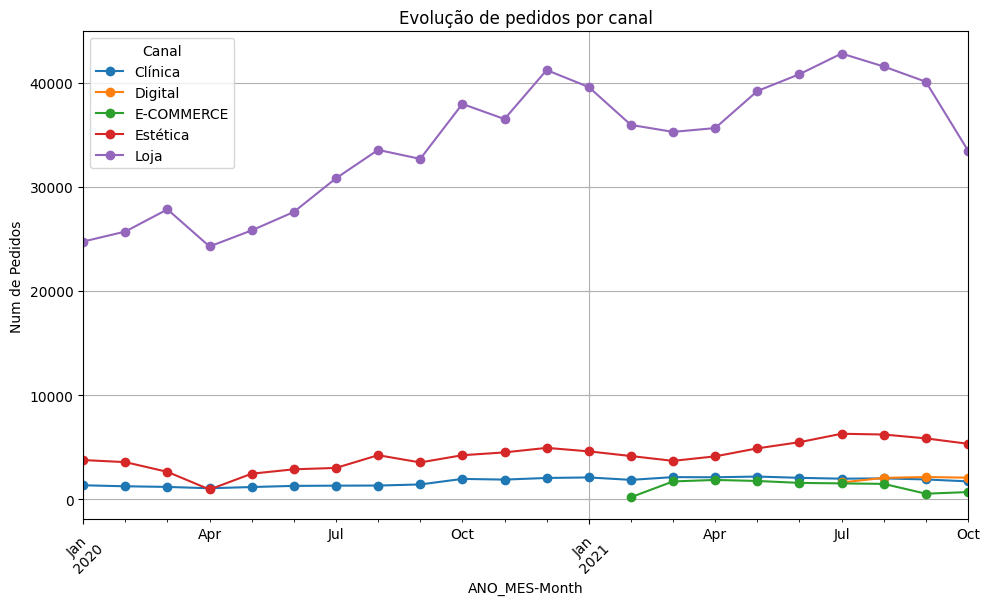

In [ ]:
grouped_data = df_chart.groupby(['ANO_MES', 'CATEGORIA_VENDA'])['PEDIDO'].nunique().unstack()

plt.figure(figsize=(10, 6))
grouped_data.plot(kind='line', marker='o', ax=plt.gca())

plt.title('Evolução de pedidos por canal')
plt.xlabel('ANO_MES-Month')
plt.ylabel('Num de Pedidos')
plt.legend(title='Canal')
plt.grid(True)
plt.tight_layout()
plt.xticks(rotation=45)
plt.show()

In [ ]:
grouped_data.to_csv('CANAIS.csv', index = False)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
grouped_data.reset_index(inplace = True)
grouped_data.to_csv('CANAIS.csv', index = False)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



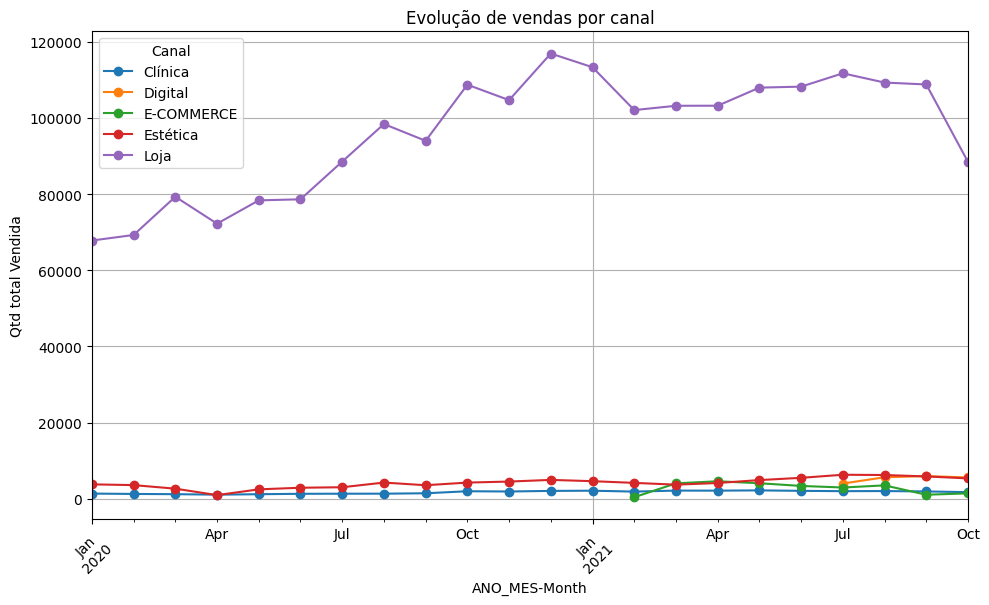

In [ ]:
grouped_data_2 = df_chart.groupby(['ANO_MES', 'CATEGORIA_VENDA'])['QUANTIDADE'].sum().unstack()

plt.figure(figsize=(10, 6))
grouped_data_2.plot(kind='line', marker='o', ax=plt.gca())

plt.title('Evolução de vendas por canal')
plt.xlabel('ANO_MES-Month')
plt.ylabel('Qtd total Vendida')
plt.legend(title='Canal')
plt.grid(True)
plt.tight_layout()
plt.xticks(rotation=45)
plt.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



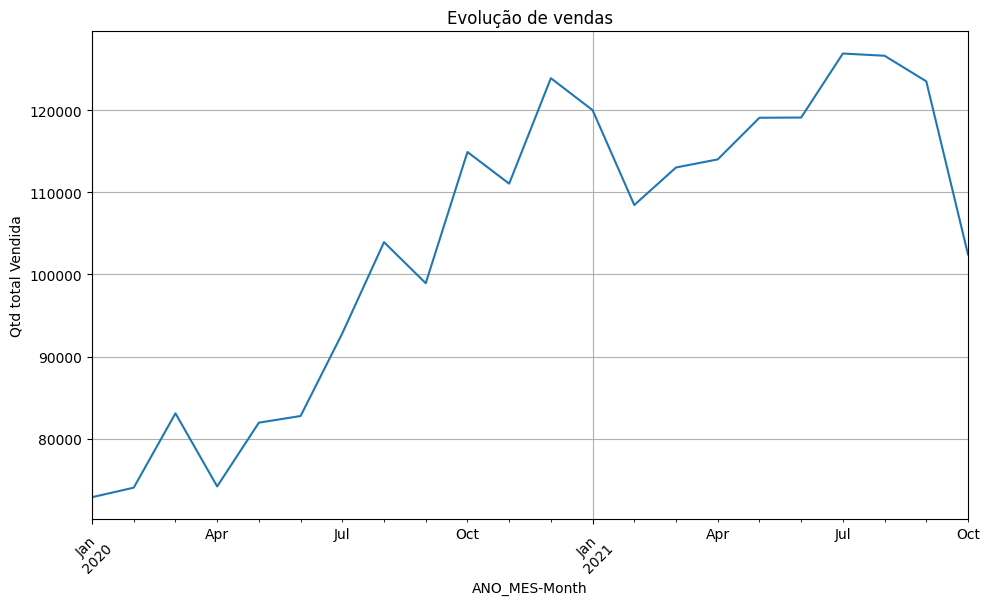

In [ ]:
grouped_data_3 = df_chart.groupby(['ANO_MES'])['QUANTIDADE'].sum()

plt.figure(figsize=(10, 6))
grouped_data_3.plot(kind='line', ax=plt.gca())

plt.title('Evolução de vendas')
plt.xlabel('ANO_MES-Month')
plt.ylabel('Qtd total Vendida')
plt.grid(True)
plt.tight_layout()
plt.xticks(rotation=45)
plt.show()

### Comentário
#### Verifica-se que no período observado o número de pedidos apresentou uma tendência de evolução crescente, com pico em Julho de 2021. Entretanto, as vendas em 2021 não estão evoluindo na mesma força que em 2020.
#### A analise também revela como as vendas de itens de loja ainda preponderam sobre os demais canais/formas de serviço, o que revela uma oportunidade importante de crescimento, por exemplo, nas vendas de produtos pelo e-commerce, bem como na ampliação da oferta e venda de serviços.

In [ ]:
filtro = produto[produto.NIVEL_3.isna() & produto.NIVEL_1.isna() & produto.NIVEL_2.isna() & produto.NIVEL_4.isna()]['ID_PRODUTO']

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
vendas_total[vendas_total.ID_VENDA == 1]

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



,ID_VENDA,DATA_VENDA,ID_CLIENTE,ID_PRODUTO,QUANTIDADE,CATEGORIA_VENDA,FILIAL,ID_PEDIDO,UNIDADE,NIVEL_1,...,NIVEL_3,NIVEL_4,SEXO,DATA_NASCIMENTO,PRIMEIRA_COMPRA,TEMPO_CASA,ANO,MES,DIA_SEMANA,PEDIDO
2,1,2021-02-12,70766.0,2240,1.0,E-COMMERCE,101,"1, 70766.0, 2021/02/12",UN,CAES,...,CAMINHAS E CASINHAS,ALMOFADAS E COLCHONETES,,1900-01-01,2021-02-12,256.0,2021,2,4,1_2021-02-12_70766.0
462837,1,2021-03-02,66082.0,41,2.0,E-COMMERCE,102,"1, 66082.0, 2021/03/02",UN,CAES,...,PELE E PELAGEM,TRATAMENTO PARA PELE,F,1982-03-06,2021-01-10,289.0,2021,3,1,1_2021-03-02_66082.0
462838,1,2021-03-02,66082.0,30724,1.0,E-COMMERCE,102,"1, 66082.0, 2021/03/02",UN,CAES,...,UTENSILIOS PARA BANHO,SHAMPOOS E COSMETICOS,F,1982-03-06,2021-01-10,289.0,2021,3,1,1_2021-03-02_66082.0
842290,1,2021-03-05,73391.0,3329,1.0,E-COMMERCE,103,"1, 73391.0, 2021/03/05",UN,CAES,...,RACOES,RACAO SECA,,1900-01-01,2021-03-05,235.0,2021,3,4,1_2021-03-05_73391.0
1075833,1,2021-03-09,60927.0,300,1.0,E-COMMERCE,104,"1, 60927.0, 2021/03/09",UN,ROEDORES,...,RACOES - FENOS - ALFAFAS,NaN,F,1984-05-16,2020-12-13,317.0,2021,3,1,1_2021-03-09_60927.0
1075834,1,2021-03-09,60927.0,10025,1.0,E-COMMERCE,104,"1, 60927.0, 2021/03/09",UN,CAES,...,RACOES,RACAO UMIDA (SACHES E LATAS),F,1984-05-16,2020-12-13,317.0,2021,3,1,1_2021-03-09_60927.0
1075835,1,2021-03-09,60927.0,3246,1.0,E-COMMERCE,104,"1, 60927.0, 2021/03/09",UN,CAES,...,RACOES,RACAO SECA,F,1984-05-16,2020-12-13,317.0,2021,3,1,1_2021-03-09_60927.0
1075836,1,2021-03-09,60927.0,55,1.0,E-COMMERCE,104,"1, 60927.0, 2021/03/09",UN,CAES,...,PULGAS - CARRAPATOS - VERMES,ANTIPULGAS E CARRAPATOS,F,1984-05-16,2020-12-13,317.0,2021,3,1,1_2021-03-09_60927.0
1075837,1,2021-03-09,60927.0,7961,1.0,E-COMMERCE,104,"1, 60927.0, 2021/03/09",UN,CAES,...,RACOES,RACAO UMIDA (SACHES E LATAS),F,1984-05-16,2020-12-13,317.0,2021,3,1,1_2021-03-09_60927.0
1355898,1,2021-03-04,39093.0,8723,1.0,E-COMMERCE,105,"1, 39093.0, 2021/03/04",UN,GATOS,...,RACOES,RACAO MEDICAMENTOSA,,1900-01-01,2020-07-01,482.0,2021,3,3,1_2021-03-04_39093.0


In [ ]:
produto.UNIDADE.value_counts()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



UN    37848
PC      264
CX       55
DP       36
DS       23
SC       19
EA       12
FR        8
FD        7
CT        7
BA        5
PT        4
1         4
CR        3
MT        2
pc        2
KG        2
PE        2
BS        1
KI        1
DZ        1
CJ        1
PA        1
Name: UNIDADE, dtype: int64

In [ ]:
venda[venda.ID_PRODUTO > 38307].value_counts() ## 55 produtos não identificados

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



ID_VENDA  DATA_VENDA  ID_CLIENTE  ID_PRODUTO  QUANTIDADE  CATEGORIA_VENDA  FILIAL  ID_PEDIDO                  
3923      2020-01-02  21056.0     38308       109.9       Estética         101     3923, 21056.0, 2020/01/02      1
450117    2021-01-07  64922.0     38324       46.0        Estética         104     450117, 64922.0, 2021/01/07    1
450131    2021-01-07  54274.0     38324       7.0         Estética         104     450131, 54274.0, 2021/01/07    1
450129    2021-06-18  83120.0     38324       39.9        Estética         103     450129, 83120.0, 2021/06/18    1
          2021-01-07  15302.0     38324       60.0        Estética         104     450129, 15302.0, 2021/01/07    1
                                                                                                                 ..
279009    2020-08-13  38828.0     38322       35.0        Estética         102     279009, 38828.0, 2020/08/13    1
279007    2020-08-13  13549.0     38322       10.0        Estética         10

In [ ]:
venda[venda.ID_PRODUTO > 38307]['CATEGORIA_VENDA'].value_counts() # Boa parte deles pertencem a categoria clinica ou estética

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



Estética    91187
Clínica     37179
Loja          137
Name: CATEGORIA_VENDA, dtype: int64

In [ ]:
venda[venda.ID_PRODUTO.isin(filtro)]['CATEGORIA_VENDA'].value_counts() # Existem alguns produtos que nao possuem nenhuma categoria mas que foram vendidos

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



Loja          1876
Digital         14
E-COMMERCE      10
Name: CATEGORIA_VENDA, dtype: int64

In [ ]:
vendas_total[(vendas_total.CATEGORIA_VENDA == 'Clínica') | (vendas_total.CATEGORIA_VENDA == 'Estética')]

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



,ID_VENDA,DATA_VENDA,ID_CLIENTE,ID_PRODUTO,QUANTIDADE,CATEGORIA_VENDA,FILIAL,ID_PEDIDO,UNIDADE,NIVEL_1,...,NIVEL_3,NIVEL_4,SEXO,DATA_NASCIMENTO,PRIMEIRA_COMPRA,TEMPO_CASA,ANO,MES,DIA_SEMANA,PEDIDO
6207,3923,2020-01-02,21056.0,38308,1.0,Estética,101,"3923, 21056.0, 2020/01/02",NaN,NaN,...,NaN,NaN,,1900-01-01,2019-04-12,928.0,2020,1,3,3923_2020-01-02_21056.0
6208,3924,2020-01-02,4893.0,38309,1.0,Clínica,101,"3924, 4893.0, 2020/01/02",NaN,NaN,...,NaN,NaN,,1900-01-01,2017-09-19,1498.0,2020,1,3,3924_2020-01-02_4893.0
6209,3925,2020-01-02,12833.0,38308,1.0,Estética,101,"3925, 12833.0, 2020/01/02",NaN,NaN,...,NaN,NaN,,1900-01-01,2018-08-04,1179.0,2020,1,3,3925_2020-01-02_12833.0
6210,3926,2020-01-02,25511.0,38308,1.0,Estética,101,"3926, 25511.0, 2020/01/02",NaN,NaN,...,NaN,NaN,,1900-01-01,2019-08-15,803.0,2020,1,3,3926_2020-01-02_25511.0
6211,3927,2020-01-02,298.0,38309,1.0,Clínica,101,"3927, 298.0, 2020/01/02",NaN,NaN,...,NaN,NaN,,1900-01-01,2017-05-03,1637.0,2020,1,3,3927_2020-01-02_298.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1858970,854291,2021-10-25,94724.0,38323,1.0,Estética,110,"854291, 94724.0, 2021/10/25",NaN,NaN,...,NaN,NaN,,1900-01-01,2021-08-07,80.0,2021,10,0,854291_2021-10-25_94724.0
1858971,854292,2021-10-25,41156.0,38323,1.0,Estética,110,"854292, 41156.0, 2021/10/25",NaN,NaN,...,NaN,NaN,M,1977-04-05,2020-07-29,454.0,2021,10,0,854292_2021-10-25_41156.0
1858972,854293,2021-10-25,41156.0,38323,1.0,Estética,110,"854293, 41156.0, 2021/10/25",NaN,NaN,...,NaN,NaN,M,1977-04-05,2020-07-29,454.0,2021,10,0,854293_2021-10-25_41156.0
1858973,854294,2021-10-25,90748.0,38323,1.0,Estética,110,"854294, 90748.0, 2021/10/25",NaN,NaN,...,NaN,NaN,,1900-01-01,2021-07-03,115.0,2021,10,0,854294_2021-10-25_90748.0


In [ ]:
vendas_total[(vendas_total.CATEGORIA_VENDA == 'Clínica') | (vendas_total.CATEGORIA_VENDA == 'Estética')].isnull().sum()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



ID_VENDA                0
DATA_VENDA              0
ID_CLIENTE            534
ID_PRODUTO              0
QUANTIDADE              0
CATEGORIA_VENDA         0
FILIAL                  0
ID_PEDIDO               0
UNIDADE            128366
NIVEL_1            128366
NIVEL_2            128366
NIVEL_3            128366
NIVEL_4            128366
SEXO                  728
DATA_NASCIMENTO       749
PRIMEIRA_COMPRA       728
TEMPO_CASA            728
ANO                     0
MES                     0
DIA_SEMANA              0
PEDIDO                  0
dtype: int64

# Previsão de demanda

In [ ]:
produto[produto.NIVEL_1 == 'CAES'].UNIDADE.value_counts() # Verificando as unidades da categoria caes

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



UN    18663
PC      101
DP       15
DS       12
CX        6
SC        5
FR        2
CT        2
FD        2
1         1
Name: UNIDADE, dtype: int64

In [ ]:
vendas_total['NIVEL_1'].value_counts(normalize = True)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



CAES        0.710087
GATOS       0.181865
AVES        0.033988
ROEDORES    0.028846
PEIXES      0.027766
PESSOAS     0.017448
Name: NIVEL_1, dtype: float64

In [ ]:
prev_demanda = vendas_total.groupby('DATA_VENDA')[['QUANTIDADE']].sum().reset_index()
prev_demanda.sort_values(['DATA_VENDA'], inplace=True) # Filtrando agora para realizar a previsao da categoria de caes
prev_demanda

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



,DATA_VENDA,QUANTIDADE
0,2020-01-02,2794.0
1,2020-01-03,2628.0
2,2020-01-04,3331.0
3,2020-01-05,2066.0
4,2020-01-06,2654.0
...,...,...
658,2021-10-22,4161.0
659,2021-10-23,5341.0
660,2021-10-24,3605.0
661,2021-10-25,4701.0


In [ ]:
prev_demanda.DATA_VENDA = pd.to_datetime(prev_demanda.DATA_VENDA, format = "%Y/%m/%d")
prev_demanda.set_index('DATA_VENDA', inplace=True)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



<Axes: xlabel='DATA_VENDA'>

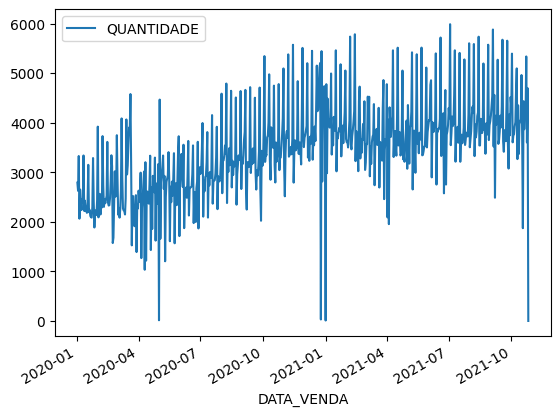

In [ ]:
prev_demanda.plot()

In [ ]:
prev_demanda.reset_index(inplace = True)
prev_demanda.to_csv('QUANTIDADE_TOTAL.csv', index = False)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
prev_demanda = vendas_total[(vendas_total.NIVEL_1 == 'CAES') & ((vendas_total.UNIDADE == 'UN') | (vendas_total.UNIDADE == 'PC'))].groupby('DATA_VENDA')[['QUANTIDADE']].sum().reset_index()
prev_demanda.sort_values(['DATA_VENDA'], inplace=True) # Filtrando agora para realizar a previsao da categoria de caes
prev_demanda

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



,DATA_VENDA,QUANTIDADE
0,2020-01-02,1697.0
1,2020-01-03,1637.0
2,2020-01-04,2003.0
3,2020-01-05,1259.0
4,2020-01-06,1624.0
...,...,...
654,2021-10-21,2468.0
655,2021-10-22,2610.0
656,2021-10-23,3303.0
657,2021-10-24,2280.0


In [ ]:
prev_demanda.DATA_VENDA = pd.to_datetime(prev_demanda.DATA_VENDA, format = "%Y/%m/%d")
prev_demanda.set_index('DATA_VENDA', inplace=True)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
prev_demanda = prev_demanda.asfreq('D') # Preenchendo dias que não estavam no df com vazios

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
# prev_demanda.QUANTIDADE.interpolate(method='linear', inplace = True) # Preenchendo os dias vazios com interpolação
prev_demanda.fillna(0, inplace = True) # decidi por manter preencher os vazios com 0 já que o modelo perfomo melhor nos dias previstos

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
prev_demanda

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



,QUANTIDADE
DATA_VENDA,
2020-01-02,1697.0
2020-01-03,1637.0
2020-01-04,2003.0
2020-01-05,1259.0
2020-01-06,1624.0
...,...
2021-10-21,2468.0
2021-10-22,2610.0
2021-10-23,3303.0


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



<Axes: xlabel='DATA_VENDA'>

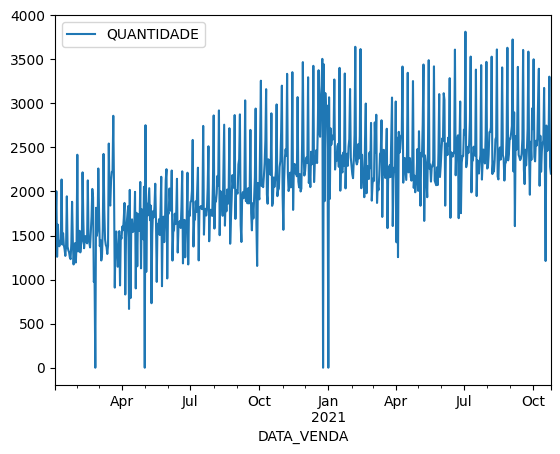

In [ ]:
prev_demanda.plot() # Não se trata também de uma serie estacionaria

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



<Axes: xlabel='DATA_VENDA'>

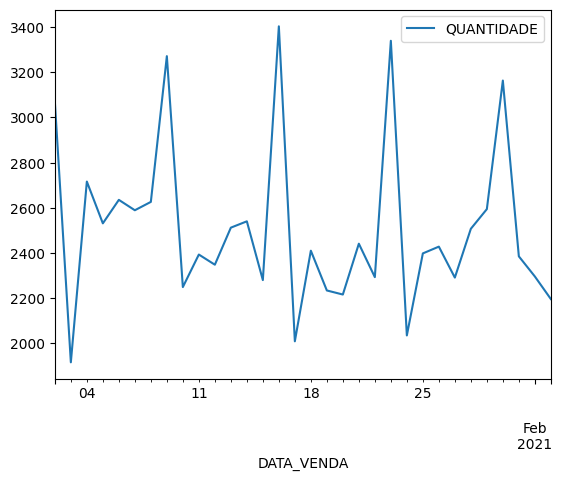

In [ ]:
prev_demanda['2021-01-02':'2021-02-02'].plot() # Clara sazonalidade semanal

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



<Axes: xlabel='DATA_VENDA'>

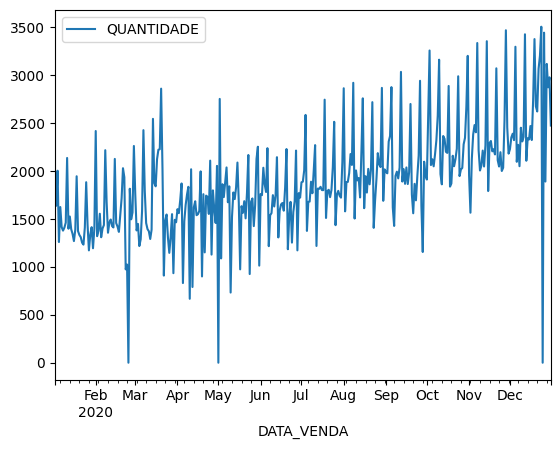

In [ ]:
prev_demanda['2020-01-02':'2020-12-31'].plot() # É observado uma certa tendencia crescente em 2020

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



<Axes: xlabel='DATA_VENDA'>

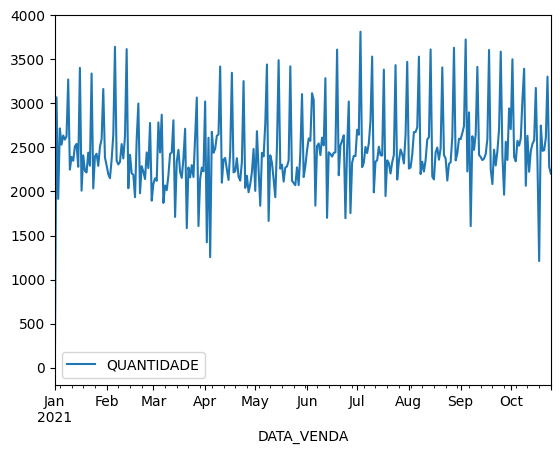

In [ ]:
prev_demanda['2021-01-01':'2021-10-25'].plot() # E uma estagnação nas vendas em 2021

In [ ]:
vendas_total.DATA_VENDA.min()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



Timestamp('2020-01-02 00:00:00')

In [ ]:
vendas_total.DATA_VENDA.max()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



Timestamp('2021-10-26 00:00:00')

In [ ]:
df_train = prev_demanda['2020-01':'2021-04'] # ~73% dos dados # Fiz questão dele pegar os dados até abril já que são meses que iremos prever
df_test = prev_demanda['2021-05':'2021-10-25'] # ~27% dos dados
X_train = df_train.drop(columns=["QUANTIDADE"])
y_train = df_train["QUANTIDADE"]
X_test = df_test.drop(columns=["QUANTIDADE"])
y_test = df_test["QUANTIDADE"]

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
# smodel = pm.auto_arima(df_train, start_p=1, start_q=1,
                         # test='adf',
                         # max_p=2, max_q=2, m=7,
                         # start_P=0, seasonal=True,
                         # d=None, D=1, trace=True,
                         # error_action='ignore',
                         # suppress_warnings=True,
                         # stepwise=True)
# smodel.summary()

# O Auto arima calculou os parametros usadas logo abaixo para o SARIMA

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
ar_model = SARIMAX(df_train, order=(0,0,3),
                   seasonal_order = (0,1,1,7))

ar_fit = ar_model.fit()

prev_pedido = ar_fit.predict(df_test.index[0], df_test.index[-1], typ='levels')

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning:

Unknown keyword arguments: dict_keys(['typ']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.



/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



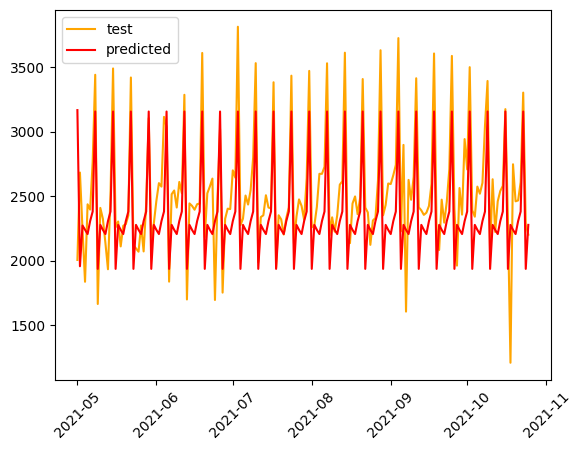

In [ ]:
plt.plot(df_test, color='orange', label= 'test') # Observamos que o sarima entende a oscilação e sazonalidade mas acaba jogando na média o que pode ser um grande erro principalmente
# em março e abril que vimos um declinio nas vendas
plt.plot(prev_pedido, color='red', label = 'predicted')
plt.legend()
plt.xticks(rotation = 45)
plt.show()

In [ ]:
t = pd.DataFrame(prev_pedido)
t.reset_index(inplace = True)
t.rename(columns = {'index':'DATA_VENDA','predicted_mean':'QUANTIDADE'})
t.to_csv('SARIMA.csv', index = False)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
prev_demanda.reset_index(inplace = True) # Criando variaveis explicativas para o modelo e adicionando o intervalo que iremos prever
previsao = pd.DataFrame({'date':pd.date_range(start='2021-10-26', end='2022-05-01')})
previsao.rename( columns={'date':'DATA_VENDA'}, inplace = True)
prev_demanda = pd.concat([prev_demanda,previsao])
prev_demanda["semana"] = (prev_demanda["DATA_VENDA"].dt.isocalendar().week).astype(int)
prev_demanda["dia"] = prev_demanda["DATA_VENDA"].dt.day
prev_demanda["mes"] = prev_demanda["DATA_VENDA"].dt.month
prev_demanda["dia_semana"] = prev_demanda["DATA_VENDA"].dt.dayofweek
prev_demanda.set_index('DATA_VENDA', inplace=True)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
brazil_holidays = holidays.Brazil()
dates_of_holidays = []
for date, name in sorted(
    holidays.Brazil(
        years=[2020,2021]
    ).items()
):
    dates_of_holidays.append(date)

prev_demanda['temp'] = prev_demanda.index.to_pydatetime()

prev_demanda["Feriado"] = prev_demanda['temp'].apply(lambda t: 1 if t.date() in dates_of_holidays else 0)
prev_demanda["Quarter"] = prev_demanda["temp"].apply(lambda t: t.quarter)
prev_demanda["DayOfYear"] = prev_demanda["temp"].apply(lambda t: t.dayofyear)
prev_demanda["WeekOfYear"] = prev_demanda["temp"].apply(lambda t: t.weekofyear)
prev_demanda['lag_1'] = prev_demanda['QUANTIDADE'].shift(1, freq = 'D')
prev_demanda['lag_7'] = prev_demanda['QUANTIDADE'].shift(7, freq = 'D')
prev_demanda['lag_14'] = prev_demanda['QUANTIDADE'].shift(14, freq = 'D')
prev_demanda['lag_21'] = prev_demanda['QUANTIDADE'].shift(21, freq = 'D')
prev_demanda['lag_28'] = prev_demanda['QUANTIDADE'].shift(28, freq = 'D')

prev_demanda['rolling_mean_30'] = prev_demanda['QUANTIDADE'].rolling(window=30).mean()

prev_demanda.drop(columns=["temp"], inplace=True)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
df_train = prev_demanda['2020-01':'2021-04'] # ~73% dos dados
df_test = prev_demanda['2021-05':'2021-10-25'] # ~27% dos dados
X_train = df_train.drop(columns=["QUANTIDADE",'rolling_mean_30'])
y_train = df_train["QUANTIDADE"]
X_test = df_test.drop(columns=["QUANTIDADE",'rolling_mean_30'])
y_test = df_test["QUANTIDADE"]

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
#Gridsearch
cv = TimeSeriesSplit(n_splits=10)

parameters = {"learning_rate": [0.1, 0.05, 0.06, 0.07, 0.09],
              #The learning rate is the shrinkage you do at every step you are making

               "gamma" : [0.01, 0.05,0.1, 0.3, 0.5],
              #A node is split only when the resulting split gives a positive reduction in the loss function. Gamma specifies the minimum loss reduction required to make a split.
              #Makes the algorithm conservative. The values can vary depending on the loss function and should be tuned.

               "max_depth": [2, 4, 5, 6, 7],
              #The maximum depth of a tree, same as GBM.
              #Used to control over-fitting as higher depth will allow model to learn relations very specific to a particular sample.

               "colsample_bytree": [0.2,0.3, 0.6],
              #Denotes the fraction of columns to be randomly samples for each tree.

               "subsample": [0.1,0.2, 0.4, 0.5],
              #Denotes the fraction of observations to be randomly samples for each tree.
              #Lower values make the algorithm more conservative and prevents overfitting but too small values might lead to under-fitting.

               "reg_alpha": [0, 0.5, 1,1.5,2],
              #L1 regularization term on weights. Increasing this value will make model more conservative.

               "reg_lambda": [1, 1.5, 2, 3, 4.5],
              #L2 regularization term on weights. Increasing this value will make model more conservative.

               "min_child_weight": [1, 3, 5, 6],
              #The larger min_child_weight is, the more conservative the algorithm will be.

               "n_estimators": [50,100,150,200]}
              #The more, the higher the risk of overfitting

xgbr = xgb.XGBRegressor(objective='reg:squarederror')

# Create RandomizedSearchCV Object
xgb_rscv = RandomizedSearchCV(xgbr,
                              param_distributions=parameters,
                              verbose=3,
                              random_state=42,
                              cv=cv,
                              error_score='raise'
                              )

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
model_xgboost = xgb_rscv.fit(X_train, y_train) # treinando o modelo

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



Fitting 10 folds for each of 10 candidates, totalling 100 fits
[CV 1/10] END colsample_bytree=0.2, gamma=0.3, learning_rate=0.1, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=1, reg_lambda=4.5, subsample=0.4;, score=0.074 total time=   0.1s
[CV 2/10] END colsample_bytree=0.2, gamma=0.3, learning_rate=0.1, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=1, reg_lambda=4.5, subsample=0.4;, score=0.105 total time=   0.1s
[CV 3/10] END colsample_bytree=0.2, gamma=0.3, learning_rate=0.1, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=1, reg_lambda=4.5, subsample=0.4;, score=0.321 total time=   0.1s
[CV 4/10] END colsample_bytree=0.2, gamma=0.3, learning_rate=0.1, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=1, reg_lambda=4.5, subsample=0.4;, score=-0.271 total time=   0.1s
[CV 5/10] END colsample_bytree=0.2, gamma=0.3, learning_rate=0.1, max_depth=4, min_child_weight=1, n_estimators=200, reg_alpha=1, reg_lambda=4.5, subsample=0.4;, sc

In [ ]:
model_xgboost.best_params_ # observando os melhores parametros

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



{'subsample': 0.4,
 'reg_lambda': 4.5,
 'reg_alpha': 1.5,
 'n_estimators': 200,
 'min_child_weight': 6,
 'max_depth': 4,
 'learning_rate': 0.06,
 'gamma': 0.05,
 'colsample_bytree': 0.3}

In [ ]:
reg = xgb.XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree= model_xgboost.best_params_['colsample_bytree'], gamma= model_xgboost.best_params_['gamma'],
             importance_type='gain', interaction_constraints='',
             learning_rate= model_xgboost.best_params_['learning_rate'], max_delta_step=0, max_depth= model_xgboost.best_params_['max_depth'],
             min_child_weight= model_xgboost.best_params_['min_child_weight'], missing=np.nan, monotone_constraints='()',
             n_estimators= model_xgboost.best_params_['n_estimators'], n_jobs=2, num_parallel_tree=1,
             objective='reg:squarederror', random_state=0, reg_alpha= model_xgboost.best_params_['reg_alpha'],
             reg_lambda= model_xgboost.best_params_['reg_lambda'], scale_pos_weight=1,
             subsample= model_xgboost.best_params_['subsample'], validate_parameters=1,
             verbosity=None) # atribuindo ao modelo os melhores parametros

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
model_xgboost = reg.fit(X_train, y_train) # Treinando o modelo com os melhores parametros

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
yhat = reg.predict(X_test) # realizando a previsao

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



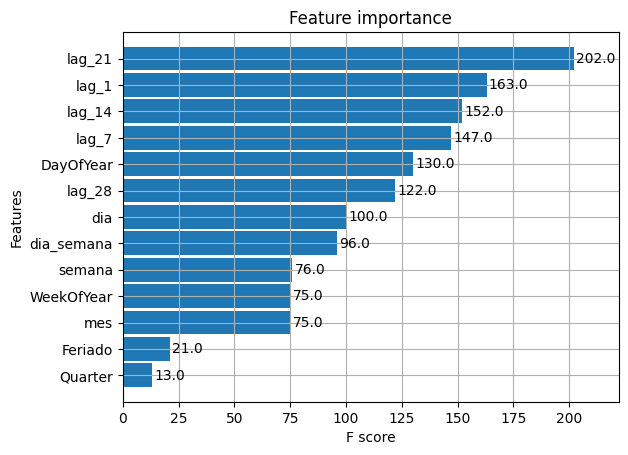

In [ ]:
_ = plot_importance(reg, height=0.9) # Observando quais as var o modelo considerou mais relevante para previsao

In [ ]:
df_previsao = prev_demanda['2021-05':'2021-10-25'] # Criando uma tabela com a previsao para comparar com o real
df_previsao['QUANTIDADE'] = yhat
df_previsao.drop(columns = ['mes','dia','semana','rolling_mean_30','dia_semana','lag_1','lag_14','lag_7','lag_28','lag_21','Feriado',"Quarter","DayOfYear","WeekOfYear"], inplace = True)
df_previsao

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.

<ipython-input-227-66dfd94fa852>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-227-66dfd94fa852>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,QUANTIDADE
DATA_VENDA,
2021-05-01,2625.049072
2021-05-02,1773.896362
2021-05-03,2316.126221
2021-05-04,2270.226074
2021-05-05,2258.912109
...,...
2021-10-21,2622.244629
2021-10-22,2841.927246
2021-10-23,3429.832275


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



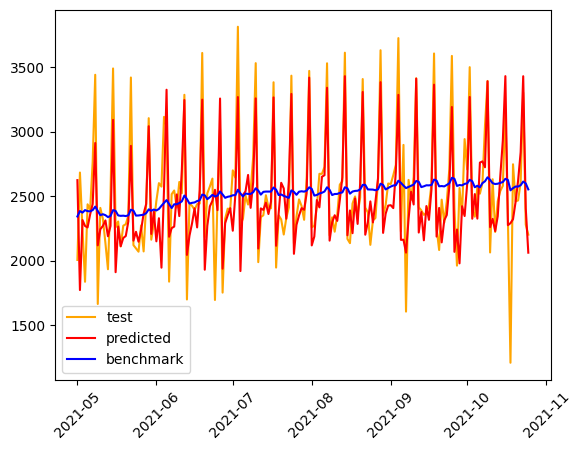

In [ ]:
plt.plot(y_test, color='orange', label= 'test')
plt.plot(df_previsao, color='red', label = 'predicted')
plt.plot(prev_demanda['2021-05':'2021-10-25']['rolling_mean_30'], color='blue', label = 'benchmark')
plt.legend()
plt.xticks(rotation = 45)
plt.show()

In [ ]:
import math

rmse_test_rf = math.sqrt(mean_squared_error(y_test, yhat))
print("RMSE do modelo no conjunto de teste:", rmse_test_rf) # xgboost apresentou melhor perfomance

RMSE do modelo no conjunto de teste: 263.6219838856185


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
rmse_test_rf = math.sqrt(mean_squared_error(y_test, prev_pedido))
print("RMSE do modelo no conjunto de teste:", rmse_test_rf) # sarima

RMSE do modelo no conjunto de teste: 308.53838918237534


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
import datetime as dt
from datetime import timedelta

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
# Prevendo de forma recursiva a venda
start_date = dt.datetime(2021,10,26,0,0,0)

last_date = dt.datetime(2022,5,1,0,0,0)

prev_demanda.drop(columns = ['rolling_mean_30'], inplace = True)

while start_date <= last_date:

  prev_demanda.reset_index(inplace = True)

  prev_demanda.loc[prev_demanda.DATA_VENDA == start_date,'QUANTIDADE'] = reg.predict(prev_demanda[prev_demanda.DATA_VENDA == start_date].drop(columns = ['DATA_VENDA','QUANTIDADE']))[0]

  prev_demanda.set_index('DATA_VENDA', inplace = True)

  prev_demanda['lag_1'] = prev_demanda['QUANTIDADE'].shift(1, freq = 'D')
  prev_demanda['lag_7'] = prev_demanda['QUANTIDADE'].shift(7, freq = 'D')
  prev_demanda['lag_14'] = prev_demanda['QUANTIDADE'].shift(14, freq = 'D')
  prev_demanda['lag_21'] = prev_demanda['QUANTIDADE'].shift(21, freq = 'D')
  prev_demanda['lag_28'] = prev_demanda['QUANTIDADE'].shift(28, freq = 'D')

  start_date = start_date + timedelta(days = 1)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



<Axes: xlabel='DATA_VENDA'>

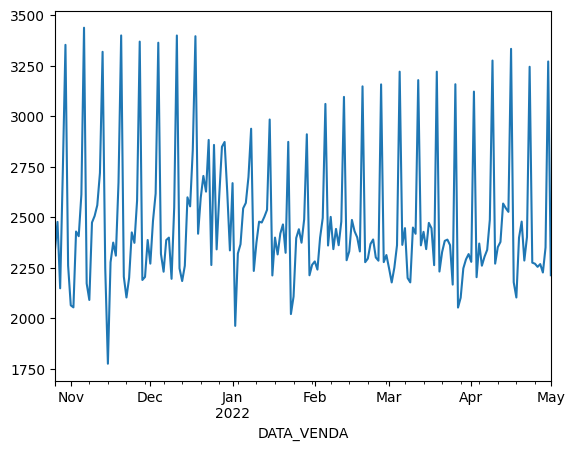

In [ ]:
prev_demanda['2021-10-26':'2022-05-01']['QUANTIDADE'].plot() # Observando a previsao dos proximos

In [ ]:
prev_demanda.reset_index(inplace = True)
prev_demanda = prev_demanda[['DATA_VENDA','QUANTIDADE']]
prev_demanda.to_csv('Dados_grupo_8.csv', index = False)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
df_previsao.reset_index(inplace = True)
df_previsao.to_csv('PREVISA_XGBOOST.csv', index = False)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



# Segmentação de clientes

In [ ]:
data_atual = vendas_total.DATA_VENDA.max() # criando a base de clientes

vendas_total.dropna(axis = 0, subset = ['ID_CLIENTE'], inplace = True)

vendas_total = vendas_total[vendas_total.PRIMEIRA_COMPRA != '1900/01/01'] # Sacrificando dados de cerca de 4% da nossa base de cliente

vendas_total['PRIMEIRA_COMPRA'] = vendas_total.groupby(['ID_CLIENTE'])['DATA_VENDA'].transform('min')

vendas_total['ULTIMA_COMPRA'] = vendas_total.groupby(['ID_CLIENTE'])['DATA_VENDA'].transform('max')

aggregations = {

        'PRIMEIRA_COMPRA': 'min',
        'ULTIMA_COMPRA': 'max',
        'ID_PEDIDO':  'nunique',
        'QUANTIDADE': 'sum',
        'TEMPO_CASA': 'max',
        'CATEGORIA_VENDA': 'nunique'

}

clientes = vendas_total.groupby('ID_CLIENTE', as_index=False).agg(aggregations)

clientes.rename(columns = {'CATEGORIA_VENDA':'NUM_CANAIS'}, inplace = True)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.

<ipython-input-236-1a6a96be46f8>:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-236-1a6a96be46f8>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
clientes.rename(columns = {'ID_PEDIDO': 'PEDIDO'}, inplace = True) # Criando as variaveis que vão ser usadas na segmentação de clientes

clientes['QUANTIDADE_POR_PEDIDO'] = clientes['QUANTIDADE'] / clientes['PEDIDO']

clientes['RECENCIA'] = (data_atual -  clientes['ULTIMA_COMPRA']).dt.days

clientes['FREQUENCIA'] =  (clientes['ULTIMA_COMPRA'] - clientes['PRIMEIRA_COMPRA']).dt.days / clientes['PEDIDO']

clientes['FREQUENCIA'] = clientes['FREQUENCIA'].replace([-np.inf, np.inf, np.nan], 0)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
clientes.info()
clientes.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 89430 entries, 0 to 89429
Data columns (total 10 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   ID_CLIENTE             89430 non-null  float64       
 1   PRIMEIRA_COMPRA        89430 non-null  datetime64[ns]
 2   ULTIMA_COMPRA          89430 non-null  datetime64[ns]
 3   PEDIDO                 89430 non-null  int64         
 4   QUANTIDADE             89430 non-null  float64       
 5   TEMPO_CASA             88488 non-null  float64       
 6   NUM_CANAIS             89430 non-null  int64         
 7   QUANTIDADE_POR_PEDIDO  89430 non-null  float64       
 8   RECENCIA               89430 non-null  int64         
 9   FREQUENCIA             89430 non-null  float64       
dtypes: datetime64[ns](2), float64(5), int64(3)
memory usage: 6.8 MB


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



,ID_CLIENTE,PRIMEIRA_COMPRA,ULTIMA_COMPRA,PEDIDO,QUANTIDADE,TEMPO_CASA,NUM_CANAIS,QUANTIDADE_POR_PEDIDO,RECENCIA,FREQUENCIA
0,7.0,2020-06-15,2021-05-08,4,4.0,1694.0,3,1.000000,171,81.750000
1,11.0,2020-10-15,2021-02-10,2,8.0,1694.0,1,4.000000,258,59.000000
2,13.0,2020-04-24,2020-04-24,1,2.0,1693.0,1,2.000000,550,0.000000
3,15.0,2021-01-08,2021-08-10,5,9.0,899.0,2,1.800000,77,42.800000
4,20.0,2020-07-31,2021-10-13,37,98.0,452.0,2,2.648649,13,11.864865


In [ ]:
clientes.dropna(axis = 0, subset = ['TEMPO_CASA'], inplace = True) # Existem alguns clientes que compraram mas não estavam na base de clientes, logo tempo_casa aparecia como nan
clientes = clientes[['ID_CLIENTE','FREQUENCIA','RECENCIA','QUANTIDADE_POR_PEDIDO', 'QUANTIDADE','PEDIDO','TEMPO_CASA','NUM_CANAIS']]

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



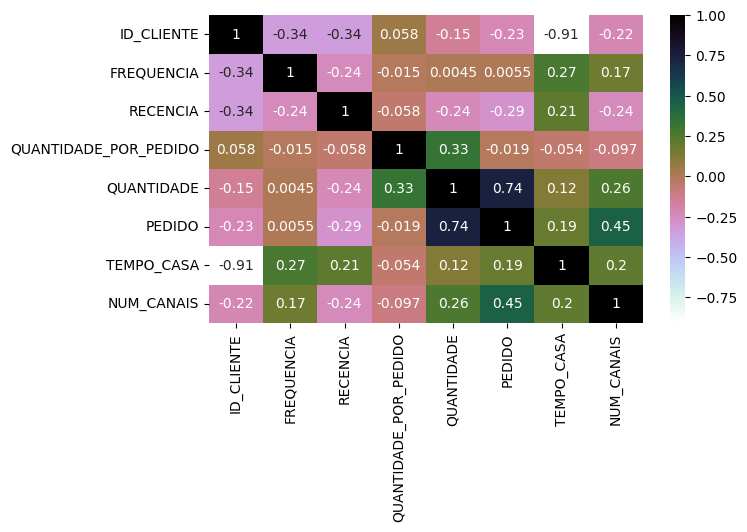

In [ ]:
plt.figure(figsize=(7,4))
sns.heatmap(clientes[['ID_CLIENTE','FREQUENCIA','RECENCIA','QUANTIDADE_POR_PEDIDO', 'QUANTIDADE','PEDIDO','TEMPO_CASA','NUM_CANAIS']].corr(),annot=True,cmap='cubehelix_r')

plt.show()

In [ ]:
# Construção do Histograma

#Preparação dos Subplots
fig = make_subplots(
    rows=6, cols=1,
    subplot_titles=('FREQUENCIA','RECENCIA','QUANTIDADE_POR_PEDIDO', 'QUANTIDADE','PEDIDO','TEMPO_CASA','NUM_CANAIS'))

#Construção dos Gráficos
fig.add_trace(go.Histogram(x=clientes['PEDIDO'], nbinsx=20), row=1, col=1)
fig.add_trace(go.Histogram(x=clientes['QUANTIDADE'],          nbinsx=100), row=2, col=1)
fig.add_trace(go.Histogram(x=clientes['QUANTIDADE_POR_PEDIDO'],    nbinsx=20), row=3, col=1)
fig.add_trace(go.Histogram(x=clientes["NUM_CANAIS"],    nbinsx = clientes["NUM_CANAIS"].nunique()+1), row=4, col=1)
fig.add_trace(go.Histogram(x=clientes["RECENCIA"],    nbinsx=50), row=5, col=1)
fig.add_trace(go.Histogram(x=clientes["FREQUENCIA"],    nbinsx=50), row=6, col=1)

#Ajuste no Layout
fig.update_layout(
    width=900,
    height=1400,
    showlegend=False)

fig.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
var_cluster = ['FREQUENCIA','RECENCIA','QUANTIDADE_POR_PEDIDO', 'QUANTIDADE','PEDIDO','TEMPO_CASA','NUM_CANAIS'] # Selecionando as variaveis da segmentação

df_cluster = clientes[var_cluster]

std_data = StandardScaler().fit_transform(df_cluster)
df_cluster = pd.DataFrame(data=std_data, columns=df_cluster.columns, index=df_cluster.index)

df_cluster.describe()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



,FREQUENCIA,RECENCIA,QUANTIDADE_POR_PEDIDO,QUANTIDADE,PEDIDO,TEMPO_CASA,NUM_CANAIS
count,8.848800e+04,8.848800e+04,8.848800e+04,8.848800e+04,8.848800e+04,8.848800e+04,8.848800e+04
mean,-9.250353e-17,-5.139085e-17,-5.909948e-17,2.569542e-18,-3.597359e-17,-4.111268e-17,2.107025e-16
std,1.000006e+00,1.000006e+00,1.000006e+00,1.000006e+00,1.000006e+00,1.000006e+00,1.000006e+00
min,-7.379785e-01,-1.006142e+00,-6.127628e-01,-4.272088e-01,-4.858911e-01,-1.112257e+00,-5.538926e-01
25%,-7.379785e-01,-8.039739e-01,-6.127628e-01,-3.911287e-01,-4.858911e-01,-7.006127e-01,-5.538926e-01
50%,-3.198662e-01,-3.605084e-01,-2.545194e-01,-2.828883e-01,-2.638756e-01,-2.810527e-01,-5.538926e-01
75%,3.345706e-01,5.720735e-01,2.231385e-01,4.183295e-02,6.914778e-02,2.414182e-01,1.071202e+00
max,8.137820e+00,3.317647e+00,4.201820e+01,1.000921e+02,1.101889e+02,3.392076e+00,5.946485e+00


In [ ]:
df_cluster.isnull().sum()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



FREQUENCIA               0
RECENCIA                 0
QUANTIDADE_POR_PEDIDO    0
QUANTIDADE               0
PEDIDO                   0
TEMPO_CASA               0
NUM_CANAIS               0
dtype: int64

In [ ]:
wcss = {}
for k in range(1, 26):
  print(k)
  kmeans = KMeans(n_clusters=k, init='k-means++', max_iter=200, n_init=10, random_state=3)
  kmeans.fit(df_cluster)
  wcss[k] = kmeans.inertia_

fig = make_subplots(
    rows=1,
    cols=1,
    subplot_titles=['Método do Cotovelo'],
    shared_xaxes=True,
    shared_yaxes=False)


fig.add_trace(
    go.Scatter(
        x=list(wcss.keys()),
        y=list(wcss.values()),
        mode='lines+markers',
        textposition='top center',
        showlegend=False),
    row=1,
    col=1)

fig.update_xaxes(visible=True, title='No. of clusters',row=1, col=1)
fig.update_yaxes(visible=True, title='Cluster Inertia',row=1, col=1)

fig.update_layout(
  title='Definição do Nº Ideal de Clusters',
  showlegend=False,
  xaxis_showticklabels=True,
  height=400,
  width=800,
  xaxis = dict(
    tickmode = 'linear',
    tick0 = 0,
    dtick = 1))

fig.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25


In [ ]:
df_cluster_km = df_cluster.copy() # Utilizando o modelo e escolhendo numero de cluster

clus = KMeans(n_clusters=3, init='k-means++', n_init=10, max_iter=300,random_state=3)
clus.fit(df_cluster_km)

df_cluster_km.loc[:, 'CLUSTER'] = clus.labels_
df_cluster_km.head()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



,FREQUENCIA,RECENCIA,QUANTIDADE_POR_PEDIDO,QUANTIDADE,PEDIDO,TEMPO_CASA,NUM_CANAIS,CLUSTER
0,1.491197,0.109043,-0.612763,-0.318968,-0.152868,3.336663,2.696296,2
1,0.870845,0.676418,0.641089,-0.174648,-0.374883,3.336663,-0.553893,1
2,-0.737979,2.580712,-0.194812,-0.391129,-0.485891,3.334024,-0.553893,1
3,0.429100,-0.503983,-0.278402,-0.138568,-0.041860,1.238863,1.071202,2
4,-0.414445,-0.921362,0.076291,3.072564,3.510389,0.059345,1.071202,2


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



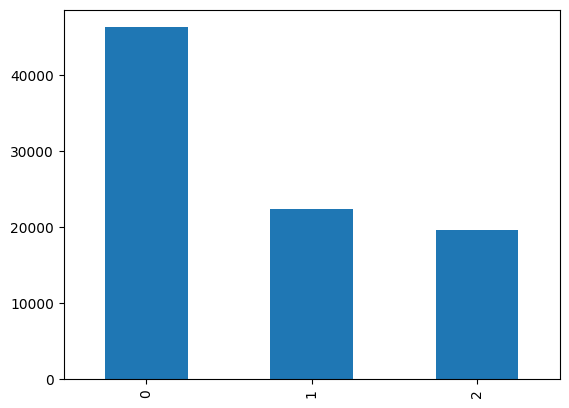

In [ ]:
df_cluster_km['CLUSTER'].value_counts().plot(kind="bar")
plt.show()

In [ ]:
clientes = pd.concat([clientes, df_cluster_km[['CLUSTER']]], axis=1)

clientes.head()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



,ID_CLIENTE,FREQUENCIA,RECENCIA,QUANTIDADE_POR_PEDIDO,QUANTIDADE,PEDIDO,TEMPO_CASA,NUM_CANAIS,CLUSTER
0,7.0,81.750000,171,1.000000,4.0,4,1694.0,3,2
1,11.0,59.000000,258,4.000000,8.0,2,1694.0,1,1
2,13.0,0.000000,550,2.000000,2.0,1,1693.0,1,1
3,15.0,42.800000,77,1.800000,9.0,5,899.0,2,2
4,20.0,11.864865,13,2.648649,98.0,37,452.0,2,2


In [ ]:
# Variáveis utilizadas na clusterização
var_cluster = clientes.set_index(['ID_CLIENTE', 'CLUSTER']).columns.tolist()
print(f'Variáveis: {var_cluster}')

Variáveis: ['FREQUENCIA', 'RECENCIA', 'QUANTIDADE_POR_PEDIDO', 'QUANTIDADE', 'PEDIDO', 'TEMPO_CASA', 'NUM_CANAIS']


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
# Analise do comportamento de uma variavel em função do Cluster

for var in var_cluster:
  fig = px.box(clientes, x=var, y='CLUSTER', points=False)
  fig.update_traces(orientation='h')
  fig.update_layout(
      title=f'Distribuição da {var} por Cluster',
      xaxis={'title': var},
      yaxis={'title': 'Cluster', 'showline': False, 'ticks': ''}
  )

  fig.update_layout(
      width=800,
      height=400,
      showlegend=False)

  fig.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
analise_volumetria = clientes.groupby('CLUSTER', as_index=False)['ID_CLIENTE'].count() # Observando a quantidade de cliente por cluster
fig = px.bar(analise_volumetria, x="CLUSTER", y="ID_CLIENTE", title="# Clientes por Cluster")
fig.update_layout(
    width=600,
    height=400,
    showlegend=False)
fig.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
analise_grupo_mean = clientes.groupby(['CLUSTER'])[var_cluster].mean().reset_index()
analise_grupo_mean.head()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



,CLUSTER,FREQUENCIA,RECENCIA,QUANTIDADE_POR_PEDIDO,QUANTIDADE,PEDIDO,TEMPO_CASA,NUM_CANAIS
0,0,25.456194,87.333456,2.670513,9.075524,3.549036,215.172926,1.123750
1,1,9.758332,367.497976,2.145277,3.763513,1.835758,607.318119,1.077984
2,2,50.581429,68.359890,2.351817,32.041561,13.712118,730.307267,2.150766


In [ ]:
fig = px.parallel_coordinates(clientes[var_cluster + ['CLUSTER']], color="CLUSTER", labels={
                                             'Quantidade':'Quantidade',
                                             'QUANTIDADE_POR_PEDIDO':'QTDE/Pedido',
                                             'RECENCIA':'Recencia',
                                             'FREQUENCIA':'Frequencia',
                                             'PEDIDO': 'PEDIDO'
                                              })
fig.update_layout(
    title={
        'text': "Cluster analysis",
        'y':1
        },
    height=500,
    width=1000)
fig.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
fig = px.parallel_coordinates(analise_grupo_mean[var_cluster + ['CLUSTER']], color="CLUSTER", labels={
                                              'Quantidade':'Quantidade',
                                             'QUANTIDADE_POR_PEDIDO':'QTDE/Pedido',
                                             'RECENCIA':'Recencia',
                                             'FREQUENCIA':'Frequencia'})
fig.update_layout(
    title={
        'text': "Cluster analysis",
        'y':1
        },
    height=500,
    width=1000)
fig.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



# Análise de churn e retenção de clientes

In [ ]:
clientes.info()
clientes.head()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 88488 entries, 0 to 88487
Data columns (total 9 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   ID_CLIENTE             88488 non-null  float64
 1   FREQUENCIA             88488 non-null  float64
 2   RECENCIA               88488 non-null  int64  
 3   QUANTIDADE_POR_PEDIDO  88488 non-null  float64
 4   QUANTIDADE             88488 non-null  float64
 5   PEDIDO                 88488 non-null  int64  
 6   TEMPO_CASA             88488 non-null  float64
 7   NUM_CANAIS             88488 non-null  int64  
 8   CLUSTER                88488 non-null  int32  
dtypes: float64(5), int32(1), int64(3)
memory usage: 6.4 MB


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



,ID_CLIENTE,FREQUENCIA,RECENCIA,QUANTIDADE_POR_PEDIDO,QUANTIDADE,PEDIDO,TEMPO_CASA,NUM_CANAIS,CLUSTER
0,7.0,81.750000,171,1.000000,4.0,4,1694.0,3,2
1,11.0,59.000000,258,4.000000,8.0,2,1694.0,1,1
2,13.0,0.000000,550,2.000000,2.0,1,1693.0,1,1
3,15.0,42.800000,77,1.800000,9.0,5,899.0,2,2
4,20.0,11.864865,13,2.648649,98.0,37,452.0,2,2


In [ ]:
clientes['CHURN'] = np.where(clientes['RECENCIA'] > 90, 1,0) # Criando a coluna de churn

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



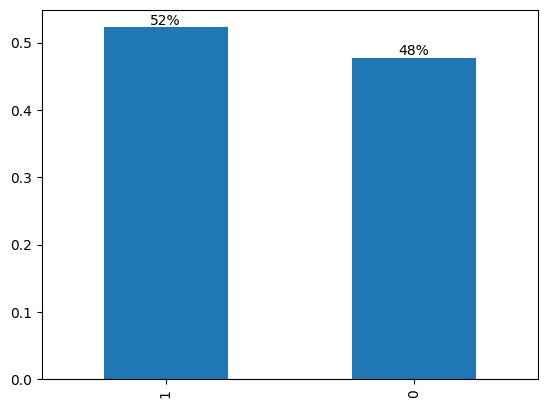

In [ ]:
_ = clientes['CHURN'].value_counts(normalize = True).plot.bar() # Taxa de churn
_ = _.bar_label(_.containers[0], fmt="{:.0%}")

In [ ]:
def get_orders_features(df, churn_aux, orders): # Função que verifica a quantidade de compra nos ultimos pedidos
  for i in orders:
    df_aux = df.sort_values(by='DATA_VENDA', ascending = False).groupby('ID_CLIENTE').head(i)
    df_aux = df_aux.groupby("ID_CLIENTE").agg({'QUT_PRODUTO':['sum', 'mean'],'QUT_TOTAL':['sum','mean']})
    df_aux.columns = [f'last_{i}_total_products', f'last_{i}_mean_products', f'last_{i}_total_amount', f'last_{i}_mean_amount']
    churn_aux = pd.merge(churn_aux, df_aux, how = 'left', on = 'ID_CLIENTE')
  for i in orders:
    if i != orders[-1]:
      churn_aux[f'total_products_diff_{orders[-1]}_{i}'] = churn_aux[f'last_{orders[-1]}_total_products'] - churn_aux[f'last_{i}_total_products']
      churn_aux[f'mean_products_diff_{orders[-1]}_{i}'] = churn_aux[f'last_{orders[-1]}_mean_products'] - churn_aux[f'last_{i}_mean_products']
      churn_aux[f'total_amount_diff_{orders[-1]}_{i}'] = churn_aux[f'last_{orders[-1]}_total_amount'] - churn_aux[f'last_{i}_total_amount']
      churn_aux[f'mean_amount_diff_{orders[-1]}_{i}'] = churn_aux[f'last_{orders[-1]}_mean_amount'] - churn_aux[f'last_{i}_mean_amount']


  return churn_aux

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
# clientes = get_orders_features(vendas_total, clientes, [2,3,4])

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
def get_correlated_features(df, threshold = 0.8):
    correlated_features = []
    features_to_remove = set()

    correlation_matrix = df.corr()

    for i in range(len(correlation_matrix .columns)):
        for j in range(i):
            if abs(correlation_matrix.iloc[i, j]) > threshold:
                colname = correlation_matrix.columns[i]

                correlated_features.append((correlation_matrix.columns[i], correlation_matrix.columns[j]))

                features_to_remove.add(colname)

    return correlated_features, features_to_remove

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
clientes_sem_coluna_churn = clientes.drop('CHURN', axis=1)
correlated_cols = get_correlated_features(clientes_sem_coluna_churn)
correlated_cols

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



([('TEMPO_CASA', 'ID_CLIENTE')], {'TEMPO_CASA'})

In [ ]:
def get_boolean_cols(df):
    bool_cols = df.isin([0,1]).all()
    return list(bool_cols[bool_cols].index)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
bool_cols = get_boolean_cols(clientes_sem_coluna_churn)
bool_cols

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



[]

In [ ]:
# df_bool_cols = clientes_sem_coluna_churn[bool_cols]

# p = .8
# sel_variance = VarianceThreshold(threshold=(p * (1 - p)))
# _ = sel_variance.fit_transform(df_bool_cols)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
# variance_removed = set(df_bool_cols.columns[~sel_variance.get_support()])
# variance_removed

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
clientes.isnull().sum()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



ID_CLIENTE               0
FREQUENCIA               0
RECENCIA                 0
QUANTIDADE_POR_PEDIDO    0
QUANTIDADE               0
PEDIDO                   0
TEMPO_CASA               0
NUM_CANAIS               0
CLUSTER                  0
CHURN                    0
dtype: int64

In [ ]:
# Treinei os modelos com a finalidade de notar que tipo de variaveis eram mais explicativas para o churn
seed = 10

X = clientes.drop(columns = ['ID_CLIENTE','CHURN','RECENCIA','CLUSTER'])
y = clientes.CHURN

X_training, X_test, y_training, y_test = train_test_split(X, y, random_state=seed, test_size=0.25, stratify=y)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
X_train, X_val, y_train, y_val = train_test_split(X_training, y_training, random_state=seed,
                                                  test_size=0.33, stratify=y_training)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
def plot_roc_curve(model, X_val, y_val, ax = None):
    roc_auc = roc_auc_score(y_val, model.predict(X_val))
    fpr, tpr, thresholds = roc_curve(y_val, model.predict_proba(X_val)[:,1])

    if ax is not None:
        ax.plot(fpr, tpr, label='AUC = %0.2f)' % roc_auc)
        ax.plot([0, 1], [0, 1],'r--')
        ax.set_xlabel('Taxa de Falsos Positivos')
        ax.set_ylabel('Taxa de Verdadeiros Positivos')
        ax.legend(loc="lower right")
    else:
        plt.figure()
        plt.plot(fpr, tpr, label='AUC = %0.2f)' % roc_auc)
        plt.plot([0, 1], [0, 1],'r--')
        plt.xlabel('Taxa de Falsos Positivos')
        plt.ylabel('Taxa de Verdadeiros Positivos')
        plt.title('Curva ROC')
        plt.legend(loc="lower right")
        plt.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
def plot_feature_importances(model, X, feature_importances):
    df_importance = pd.DataFrame({'Feature': X.columns, 'Importance': feature_importances})
    df_importance = df_importance.set_index('Feature')

    ax = df_importance.sort_values(by='Importance', ascending = False).head(10).plot.barh(figsize=(5, 5))
    ax.invert_yaxis()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
params = {'max_depth': [2, 3, 4, 5, 6, 7,8],
          'min_samples_split': [2, 3, 4, 5, 6],
          'min_samples_leaf': [1, 2, 3, 4, 5]}

tree = DecisionTreeClassifier(random_state=seed)

skf = StratifiedKFold(n_splits=3, shuffle=True, random_state=seed)

grid_search = GridSearchCV(tree, param_grid=params, scoring='roc_auc',
                           cv=skf.split(X_training, y_training))

grid_search.fit(X_training, y_training)
print('Melhores hiperparâmetros:')
print(grid_search.best_params_)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



Melhores hiperparâmetros:
{'max_depth': 8, 'min_samples_leaf': 5, 'min_samples_split': 2}


In [ ]:
tree = DecisionTreeClassifier(random_state=seed, max_depth=grid_search.best_params_['max_depth'],
                                min_samples_split=grid_search.best_params_['min_samples_split'],
                                min_samples_leaf=grid_search.best_params_['min_samples_leaf'])
tree.fit(X_train, y_train)

y_pred = tree.predict(X_val)

print("Acurácia no conjunto de treino: {:.3f}".format(tree.score(X_train, y_train)))
print("Acurácia no conjunto de validação: {:.3f}".format(tree.score(X_val, y_val)))
print(classification_report(y_val, y_pred))
print(confusion_matrix(y_val, y_pred))
print("Área sob a curva ROC: {:.3f}".format(roc_auc_score(y_val, y_pred)))

Acurácia no conjunto de treino: 0.898
Acurácia no conjunto de validação: 0.893
              precision    recall  f1-score   support

           0       0.89      0.89      0.89     10453
           1       0.90      0.90      0.90     11448

    accuracy                           0.89     21901
   macro avg       0.89      0.89      0.89     21901
weighted avg       0.89      0.89      0.89     21901

[[ 9287  1166]
 [ 1171 10277]]
Área sob a curva ROC: 0.893


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



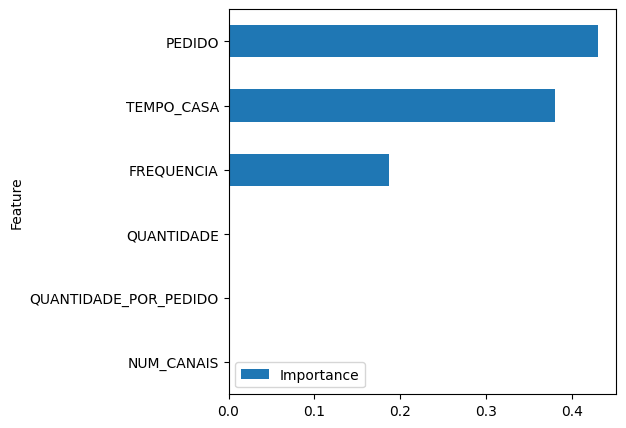

In [ ]:
plot_feature_importances(tree, X, tree.feature_importances_)

In [ ]:
params = {"C": np.arange(1, 150, 5)}

logreg = LogisticRegression(solver='liblinear')

skf = StratifiedKFold(n_splits=5, shuffle=True, random_state= seed)

grid_search = GridSearchCV(logreg, param_grid=params, scoring='roc_auc',
                           cv=skf.split(X_train, y_train))

grid_search.fit(X_train, y_train)
print('Melhores hiperparâmetros:')
print(grid_search.best_params_)

logreg = LogisticRegression(solver='liblinear', C = grid_search.best_params_['C'])

logreg.fit(X_train, y_train)

y_pred_logreg = logreg.predict(X_val)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



Melhores hiperparâmetros:
{'C': 91}


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



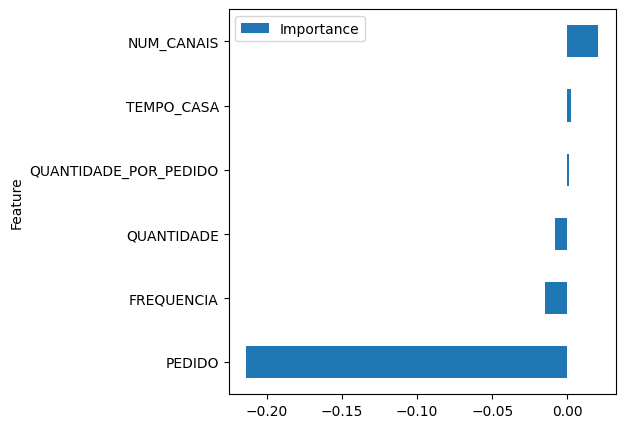

In [ ]:
plot_feature_importances(tree, X, logreg.coef_[0])

In [ ]:
print("Acurácia Treino: {:.2f}".format(logreg.score(X_train, y_train)))
print("Acurácia Validação: {:.2f}\n".format(logreg.score(X_val, y_val)))
print(classification_report(y_val, y_pred_logreg))
print("Área sob a curva ROC: {:.2f}".format(roc_auc_score(y_val, y_pred_logreg)))

Acurácia Treino: 0.73
Acurácia Validação: 0.73

              precision    recall  f1-score   support

           0       0.74      0.68      0.71     10453
           1       0.73      0.78      0.75     11448

    accuracy                           0.73     21901
   macro avg       0.73      0.73      0.73     21901
weighted avg       0.73      0.73      0.73     21901

Área sob a curva ROC: 0.73


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
params = {'learning_rate': [0.1, 0.2, 0.3],
          'alpha': [5, 10, 15],
          'colsample_bytree': [0.1, 0.3, 0.5, 0.7, 1.0],
          'max_depth': [3, 4]}

xgb_model_cv_gs = xgb.XGBClassifier(objective="binary:logistic", random_state=seed,
                                    eval_metric="auc", n_estimators=10)

skf = StratifiedKFold(n_splits=3, shuffle=True, random_state=seed)
grid_search = GridSearchCV(xgb_model_cv_gs, param_grid=params, scoring='roc_auc',
                           cv=skf.split(X_training, y_training))

grid_search.fit(X_training, y_training)
print('\n Melhores hiperparâmetros:')
print(grid_search.best_params_)

xgb_model_cv_gs.set_params(learning_rate = grid_search.best_params_['learning_rate'],
                           alpha = grid_search.best_params_['alpha'],
                           colsample_bytree = grid_search.best_params_['colsample_bytree'],
                           max_depth = grid_search.best_params_['max_depth'])

xgb_model_cv_gs.fit(X_training, y_training)
y_pred_xgb = xgb_model_cv_gs.predict(X_val)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.




 Melhores hiperparâmetros:
{'alpha': 15, 'colsample_bytree': 1.0, 'learning_rate': 0.3, 'max_depth': 4}


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



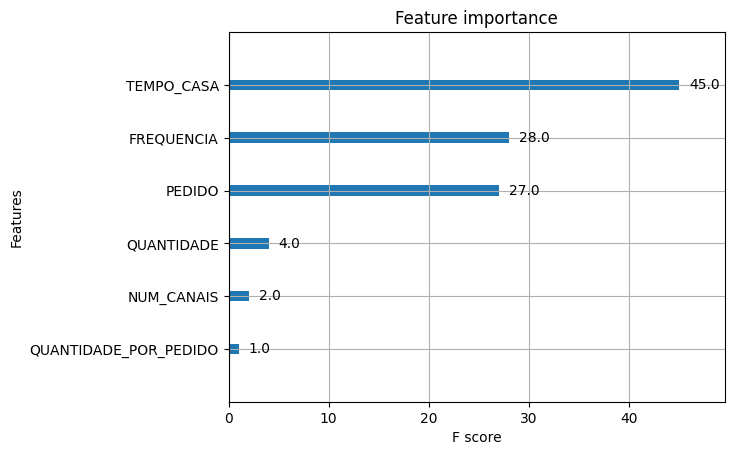

In [ ]:
xgb.plot_importance(xgb_model_cv_gs)
plt.show()

In [ ]:
print("Acurácia Treino: {:.2f}".format(xgb_model_cv_gs.score(X_train, y_train)))
print("Acurácia Validação: {:.2f}\n".format(xgb_model_cv_gs.score(X_val, y_val)))
print(classification_report(y_val, y_pred_xgb))
print("Área sob a curva ROC: {:.2f}".format(roc_auc_score(y_val, y_pred_xgb)))

Acurácia Treino: 0.90
Acurácia Validação: 0.89

              precision    recall  f1-score   support

           0       0.87      0.91      0.89     10453
           1       0.91      0.88      0.90     11448

    accuracy                           0.89     21901
   macro avg       0.89      0.89      0.89     21901
weighted avg       0.89      0.89      0.89     21901

Área sob a curva ROC: 0.89


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
# Tempo de casa, frequência e pedido são nossas variaveis mais explicativas para o churn

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
aux = clientes.groupby('CLUSTER')[['CHURN']].sum().reset_index()
aux

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



,CLUSTER,CHURN
0,0,18798
1,1,22078
2,2,5379


In [ ]:
aux['TOTAL'] = clientes.groupby('CLUSTER')['CHURN'].count()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
aux['PORC_CHURN'] = (aux['CHURN']/aux['TOTAL'])*100
aux # Podemos observar que o cluster 2 apresenta quase 100% de churn

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



,CLUSTER,CHURN,TOTAL,PORC_CHURN
0,0,18798,46303,40.597801
1,1,22078,22479,98.216113
2,2,5379,19706,27.296255


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



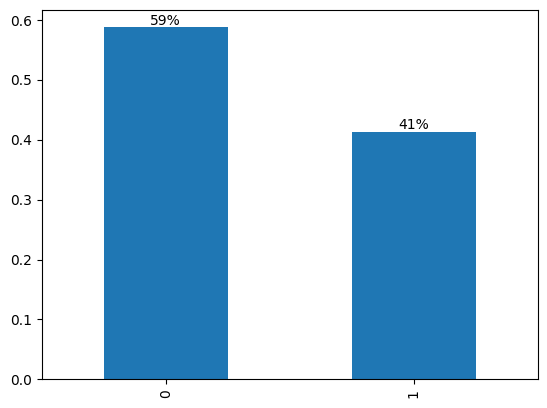

In [ ]:
_ = clientes[clientes.PEDIDO != 1]['CHURN'].value_counts(normalize = True).plot.bar() # Taxa de churn sem os clientes de compra unica
_ = _.bar_label(_.containers[0], fmt="{:.0%}")

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



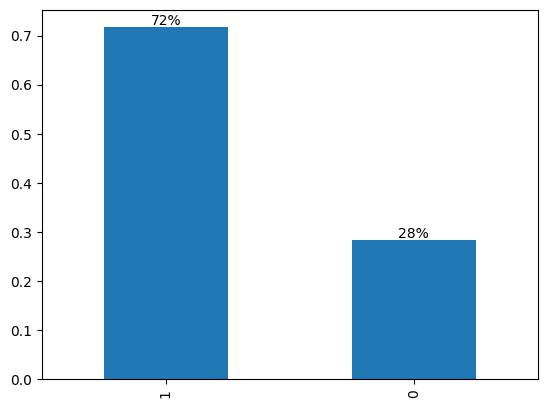

In [ ]:
_ = clientes[(clientes.TEMPO_CASA <= 600) & (clientes.PEDIDO <= 2) & (clientes.FREQUENCIA <= 5)]['CHURN'].value_counts(normalize = True).plot.bar() # Taxa de churn de clientes com certas caracteristicas
_ = _.bar_label(_.containers[0], fmt="{:.0%}")

# Recomendação de produtos

In [ ]:
vendas_total.head()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



,ID_VENDA,DATA_VENDA,ID_CLIENTE,ID_PRODUTO,QUANTIDADE,CATEGORIA_VENDA,FILIAL,ID_PEDIDO,UNIDADE,NIVEL_1,NIVEL_2,NIVEL_3,NIVEL_4,SEXO,DATA_NASCIMENTO,PRIMEIRA_COMPRA,TEMPO_CASA,ULTIMA_COMPRA
0,0,2021-02-10,45659.0,17631,1.0,E-COMMERCE,101,"0, 101, 2021/02/10",UN,CAES,ALIMENTOS,PETISCOS E OSSINHOS,BISCOITOS - BIFINHOS - SNACKS,M,1985-07-31,2020-09-08,413.0,2021-10-23
1,0,2021-02-10,45659.0,34575,1.0,E-COMMERCE,101,"0, 101, 2021/02/10",UN,CAES,ALIMENTOS,PETISCOS E OSSINHOS,BISCOITOS - BIFINHOS - SNACKS,M,1985-07-31,2020-09-08,413.0,2021-10-23
2,1,2021-02-12,70766.0,2240,1.0,E-COMMERCE,101,"1, 101, 2021/02/12",UN,CAES,ACESSORIOS,CAMINHAS E CASINHAS,ALMOFADAS E COLCHONETES,,1900-01-01,2021-02-12,256.0,2021-02-22
3,2,2021-02-12,42579.0,17707,1.0,E-COMMERCE,101,"2, 101, 2021/02/12",UN,CAES,FARMACIA,VITAMINAS E SUPLEMENTOS,VITAMINAS E SUPLEMENTOS,,1900-01-01,2020-08-13,439.0,2021-06-02
4,2,2021-02-12,42579.0,8952,1.0,E-COMMERCE,101,"2, 101, 2021/02/12",UN,CAES,FARMACIA,DEMAIS MEDICAMENTOS,TRATAMENTO DIGESTIVO,,1900-01-01,2020-08-13,439.0,2021-06-02


In [ ]:
# vendas_total.dropna(subset = ['ID_CLIENTE'], inplace = True)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
# reco = vendas_total.dropna(subset = ['NIVEL_1'])

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
# lista = reco.NIVEL_1.unique()
# lista

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



array(['CAES', 'ROEDORES', 'GATOS', 'AVES', 'PEIXES', 'PESSOAS'],
      dtype=object)

In [ ]:
# for i in range(6):
  # aux = reco[reco.NIVEL_1 == lista[i]].groupby('ID_CLIENTE')[['NIVEL_1']].nunique().reset_index()
  # aux.rename(columns = {'NIVEL_1': lista[i]}, inplace = True)
  # clientes = pd.merge(clientes, aux, how = 'left', on = 'ID_CLIENTE')

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
# clientes.fillna(0, inplace = True)
# clientes.head()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



,ID_CLIENTE,FREQUENCIA,RECENCIA,QUANTIDADE_POR_PEDIDO,QUANTIDADE,PEDIDO,TEMPO_CASA,CLUSTER,CHURN,CAES,ROEDORES,GATOS,AVES,PEIXES,PESSOAS
0,7.0,81.750000,171,1.000000,4.0,4,1694.0,0,1,1.0,0.0,0.0,0.0,0.0,0.0
1,11.0,59.000000,258,4.000000,8.0,2,1694.0,0,1,1.0,0.0,0.0,0.0,0.0,0.0
2,13.0,0.000000,550,2.000000,2.0,1,1693.0,2,1,1.0,0.0,0.0,0.0,0.0,0.0
3,15.0,42.800000,77,1.800000,9.0,5,899.0,0,0,1.0,0.0,0.0,0.0,0.0,0.0
4,20.0,11.864865,13,2.648649,98.0,37,452.0,0,0,1.0,0.0,1.0,0.0,1.0,1.0


In [ ]:
# aux = vendas_total[vendas_total.CATEGORIA_VENDA == 'Estética'].groupby('ID_CLIENTE')[['CATEGORIA_VENDA']].nunique()
# aux.rename(columns = {'CATEGORIA_VENDA': 'Estética'}, inplace = True)
# clientes = pd.merge(clientes, aux, how = 'left', on = 'ID_CLIENTE')

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
# clientes.fillna(0, inplace = True)
# clientes.info()
# clientes.head()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 88488 entries, 0 to 88487
Data columns (total 16 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   ID_CLIENTE             88488 non-null  float64
 1   FREQUENCIA             88488 non-null  float64
 2   RECENCIA               88488 non-null  int64  
 3   QUANTIDADE_POR_PEDIDO  88488 non-null  float64
 4   QUANTIDADE             88488 non-null  float64
 5   PEDIDO                 88488 non-null  int64  
 6   TEMPO_CASA             88488 non-null  float64
 7   CLUSTER                88488 non-null  int32  
 8   CHURN                  88488 non-null  int64  
 9   CAES                   88488 non-null  float64
 10  ROEDORES               88488 non-null  float64
 11  GATOS                  88488 non-null  float64
 12  AVES                   88488 non-null  float64
 13  PEIXES                 88488 non-null  float64
 14  PESSOAS                88488 non-null  float64
 15  Es

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



,ID_CLIENTE,FREQUENCIA,RECENCIA,QUANTIDADE_POR_PEDIDO,QUANTIDADE,PEDIDO,TEMPO_CASA,CLUSTER,CHURN,CAES,ROEDORES,GATOS,AVES,PEIXES,PESSOAS,Estética
0,7.0,81.750000,171,1.000000,4.0,4,1694.0,0,1,1.0,0.0,0.0,0.0,0.0,0.0,1.0
1,11.0,59.000000,258,4.000000,8.0,2,1694.0,0,1,1.0,0.0,0.0,0.0,0.0,0.0,0.0
2,13.0,0.000000,550,2.000000,2.0,1,1693.0,2,1,1.0,0.0,0.0,0.0,0.0,0.0,0.0
3,15.0,42.800000,77,1.800000,9.0,5,899.0,0,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
4,20.0,11.864865,13,2.648649,98.0,37,452.0,0,0,1.0,0.0,1.0,0.0,1.0,1.0,1.0


In [ ]:
today = df_vendas.DATA_VENDA.max()
today

In [ ]:
reference = (today - timedelta(days=90))
reference

In [ ]:
vendas_total['NIVEL_CONCAT'] = vendas_total['NIVEL 1'] + '_' + vendas_total['NIVEL 2'] + '_' + vendas_total['NIVEL 3'] + '_' + vendas_total['NIVEL 4']

In [ ]:
def encode_units(x):
    if x <= 0:
        return 0
    if x >= 1:
        return 1

In [ ]:
basket_geral = vendas_total[(vendas_total['DATA_VENDA'] >= reference)].groupby(['ID_VENDA', 'NIVEL_CONCAT'])['QUANTIDADE'].sum().unstack().reset_index().fillna(0).set_index('ID_VENDA')
basket_sets_geral = basket_geral.applymap(encode_units)
frequent_itemsets_geral = apriori(basket_sets_geral.astype('bool'), min_support=0.01, use_colnames=True)
pd.options.display.max_colwidth = 150
rules_geral = association_rules(frequent_itemsets_geral, metric="lift", min_threshold=1)
rules_geral

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
0,(CAES _ACESSORIOS _BRINQUEDOS _PARA MORDER E PUXAR ),(CAES _ALIMENTOS _PETISCOS E OSSINHOS _BISCOITOS - BIFINHOS - SNACKS ),0.066640,0.123657,0.015040,0.225691,1.825130,0.006800,1.131773,0.484373
1,(CAES _ALIMENTOS _PETISCOS E OSSINHOS _BISCOITOS - BIFINHOS - SNACKS ),(CAES _ACESSORIOS _BRINQUEDOS _PARA MORDER E PUXAR ),0.123657,0.066640,0.015040,0.121628,1.825130,0.006800,1.062601,0.515887
2,(CAES _ALIMENTOS _PETISCOS E OSSINHOS _OSSINHOS E PALITOS ),(CAES _ACESSORIOS _BRINQUEDOS _PARA MORDER E PUXAR ),0.075162,0.066640,0.010379,0.138083,2.072060,0.005370,1.082888,0.559437
3,(CAES _ACESSORIOS _BRINQUEDOS _PARA MORDER E PUXAR ),(CAES _ALIMENTOS _PETISCOS E OSSINHOS _OSSINHOS E PALITOS ),0.066640,0.075162,0.010379,0.155741,2.072060,0.005370,1.095443,0.554329
4,(CAES _ALIMENTOS _PETISCOS E OSSINHOS _OSSINHOS E PALITOS ),(CAES _ALIMENTOS _PETISCOS E OSSINHOS _BISCOITOS - BIFINHOS - SNACKS ),0.075162,0.123657,0.021967,0.292260,2.363468,0.012673,1.238227,0.623778
5,(CAES _ALIMENTOS _PETISCOS E OSSINHOS _BISCOITOS - BIFINHOS - SNACKS ),(CAES _ALIMENTOS _PETISCOS E OSSINHOS _OSSINHOS E PALITOS ),0.123657,0.075162,0.021967,0.177643,2.363468,0.012673,1.124619,0.658296
6,(CAES _ALIMENTOS _RACOES _RACAO SECA ),(CAES _ALIMENTOS _PETISCOS E OSSINHOS _BISCOITOS - BIFINHOS - SNACKS ),0.290532,0.123657,0.039203,0.134935,1.091202,0.003277,1.013037,0.117805
7,(CAES _ALIMENTOS _PETISCOS E OSSINHOS _BISCOITOS - BIFINHOS - SNACKS ),(CAES _ALIMENTOS _RACOES _RACAO SECA ),0.123657,0.290532,0.039203,0.317029,1.091202,0.003277,1.038797,0.095373
8,(CAES _ALIMENTOS _RACOES _RACAO UMIDA (SACHES E LATAS) ),(CAES _ALIMENTOS _PETISCOS E OSSINHOS _BISCOITOS - BIFINHOS - SNACKS ),0.084046,0.123657,0.018608,0.221397,1.790407,0.008215,1.125532,0.481976
9,(CAES _ALIMENTOS _PETISCOS E OSSINHOS _BISCOITOS - BIFINHOS - SNACKS ),(CAES _ALIMENTOS _RACOES _RACAO UMIDA (SACHES E LATAS) ),0.123657,0.084046,0.018608,0.150477,1.790407,0.008215,1.078198,0.503762


In [ ]:
basket_102_nivel = vendas_total[(vendas_total['FILIAL'] == 102) & (vendas_total['DATA_VENDA'] >= reference)].groupby(['ID_VENDA', 'NIVEL_CONCAT'])['QUANTIDADE'].sum().unstack().reset_index().fillna(0).set_index('ID_VENDA')
basket_sets_102_nivel = basket_102_nivel.applymap(encode_units)
frequent_itemsets_102_nivel = apriori(basket_sets_102_nivel.astype('bool'), min_support=0.01, use_colnames=True)
pd.options.display.max_colwidth = 150
rules_102_nivel = association_rules(frequent_itemsets_102_nivel, metric="lift", min_threshold=1)
rules_102_nivel

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
0,(CAES _ACESSORIOS _ACESSORIOS PARA ALIMENTACAO _COMEDOUROS E BEBEDOUROS ),(CAES _ALIMENTOS _RACOES _RACAO SECA ),0.035782,0.276533,0.010677,0.298375,1.078987,0.000782,1.031131,0.075921
1,(CAES _ALIMENTOS _RACOES _RACAO SECA ),(CAES _ACESSORIOS _ACESSORIOS PARA ALIMENTACAO _COMEDOUROS E BEBEDOUROS ),0.276533,0.035782,0.010677,0.038609,1.078987,0.000782,1.002940,0.101186
2,(CAES _ACESSORIOS _BRINQUEDOS _PARA MORDER E PUXAR ),(CAES _ACESSORIOS _BRINQUEDOS _PELUCIA - VINIL - LATEX ),0.066438,0.030761,0.010201,0.153540,4.991375,0.008157,1.145050,0.856562
3,(CAES _ACESSORIOS _BRINQUEDOS _PELUCIA - VINIL - LATEX ),(CAES _ACESSORIOS _BRINQUEDOS _PARA MORDER E PUXAR ),0.030761,0.066438,0.010201,0.331615,4.991375,0.008157,1.396744,0.825033
4,(CAES _ACESSORIOS _BRINQUEDOS _PARA MORDER E PUXAR ),(CAES _ALIMENTOS _PETISCOS E OSSINHOS _BISCOITOS - BIFINHOS - SNACKS ),0.066438,0.121829,0.015645,0.235481,1.932888,0.007551,1.148659,0.516987
5,(CAES _ALIMENTOS _PETISCOS E OSSINHOS _BISCOITOS - BIFINHOS - SNACKS ),(CAES _ACESSORIOS _BRINQUEDOS _PARA MORDER E PUXAR ),0.121829,0.066438,0.015645,0.128416,1.932888,0.007551,1.071111,0.549596
6,(CAES _ALIMENTOS _PETISCOS E OSSINHOS _OSSINHOS E PALITOS ),(CAES _ACESSORIOS _BRINQUEDOS _PARA MORDER E PUXAR ),0.082135,0.066438,0.012051,0.146718,2.208359,0.006594,1.094084,0.596139
7,(CAES _ACESSORIOS _BRINQUEDOS _PARA MORDER E PUXAR ),(CAES _ALIMENTOS _PETISCOS E OSSINHOS _OSSINHOS E PALITOS ),0.066438,0.082135,0.012051,0.181384,2.208359,0.006594,1.121240,0.586115
8,(CAES _ALIMENTOS _PETISCOS E OSSINHOS _OSSINHOS E PALITOS ),(CAES _ALIMENTOS _PETISCOS E OSSINHOS _BISCOITOS - BIFINHOS - SNACKS ),0.082135,0.121829,0.027273,0.332046,2.725517,0.017266,1.314719,0.689750
9,(CAES _ALIMENTOS _PETISCOS E OSSINHOS _BISCOITOS - BIFINHOS - SNACKS ),(CAES _ALIMENTOS _PETISCOS E OSSINHOS _OSSINHOS E PALITOS ),0.121829,0.082135,0.027273,0.223861,2.725517,0.017266,1.182604,0.720927


In [ ]:
basket_102_prod = vendas_total[(vendas_total['FILIAL'] == 102) & (vendas_total['DATA_VENDA'] >= reference)].groupby(['ID_VENDA', 'ID_PRODUTO'])['QUANTIDADE'].sum().unstack().reset_index().fillna(0).set_index('ID_VENDA')
basket_sets_102_prod = basket_102_prod.applymap(encode_units)
frequent_itemsets_102_prod = apriori(basket_sets_102_prod.astype('bool'), min_support=0.01, use_colnames=True)
pd.options.display.max_colwidth = 150
rules_102_prod = association_rules(frequent_itemsets_102_prod, metric="lift", min_threshold=1)
rules_102_prod

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric


In [ ]:
basket_102_prod = vendas_total[(vendas_total['FILIAL'] == 102) & (vendas_total['DATA_VENDA'] >= reference)].groupby(['ID_VENDA', 'ID_PRODUTO'])['QUANTIDADE'].sum().unstack().reset_index().fillna(0).set_index('ID_VENDA')
basket_102_prod

ID_PRODUTO,4,6,7,12,13,15,18,19,21,22,...,38131,38132,38135,38138,38141,38218,38219,38321,38322,38323
ID_VENDA,,,,,,,,,,,,,,,,,,,,,
2085,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2086,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2087,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2088,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2089,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
305201,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
305203,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
305205,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [ ]:
basket_sets_102_prod = basket_102_prod.applymap(encode_units)

In [ ]:
frequent_itemsets_102_prod = apriori(basket_sets_102_prod.astype('bool'), min_support=0.005, use_colnames=True)
frequent_itemsets_102_prod

,support,itemsets
0,0.005270,(263)
1,0.006981,(711)
2,0.005270,(3472)
3,0.005733,(3930)
4,0.005964,(3996)
5,0.006288,(5571)
6,0.009709,(7763)
7,0.007027,(7764)
8,0.007074,(7849)
9,0.005964,(7889)


In [ ]:
rules_102_prod = association_rules(frequent_itemsets_102_prod, metric="lift", min_threshold=0.5)
rules_102_prod

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
0,(22978),(22979),0.012945,0.008276,0.005409,0.417857,50.493017,0.005302,1.703576,0.993050
1,(22979),(22978),0.008276,0.012945,0.005409,0.653631,50.493017,0.005302,2.849723,0.988375


### Comentário Sugestão de Vendas
#### Verifica-se que a análise de vendas cruzadas é muito mais produtiva quando analisada sob a ótica das categorias do que de produtos. Isso se deve muito provavelmente ao fato de que dentro de uma certa categoria - por exemplo, rações de cães - existem inúmeros SKUs.
#### Nesse sentido, recomenda-se a análise pelo menos em um primeiro momento em um nível maior de agregação, como o proposto. A partir dela foi, possível observar relações importantes de incremento de vendas como no caso da venda de biscoitos/snacks e brinquedos para cães. Indicando que existe uma probabilidade associada grande daquela dona ou dono de cães busca diferenciar a dieta também querer oferecer um estímulo diferente, como por meio de brinquedos.